In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/crypto/

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/crypto


In [2]:
!pip install arch

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima.model import ARIMA
from arch import arch_model
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import mean_squared_error
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import xgboost as xgb

In [61]:
data = pd.read_csv('crypto_tradinds.csv')


<ipython-input-61-55a65ed61827>:1: DtypeWarning: Columns (15,16) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('crypto_tradinds.csv')


In [5]:
data.head()

,trade_date,volume,price_usd,price_btc,market_cap,capitalization_change_1_day,USD_price_change_1_day,BTC_price_change_1_day,crypto_name,crypto_type,ticker,max_supply,site_url,github_url,minable,platform_name,industry_name
0,2016-01-01,36278900.0,434.33,1.0,6.529300e+09,0.000000,0.000000,0.0,Bitcoin,0.0,BTC,21000000.0,https://bitcoin.org/,https://github.com/bitcoin/,1.0,XRP,Proof of Work (PoW)
1,2016-01-02,30096600.0,433.44,1.0,6.517390e+09,-0.001824,-0.002049,0.0,Bitcoin,0.0,BTC,21000000.0,https://bitcoin.org/,https://github.com/bitcoin/,1.0,XRP,Proof of Work (PoW)
2,2016-01-03,39633800.0,430.01,1.0,6.467430e+09,-0.007666,-0.007913,0.0,Bitcoin,0.0,BTC,21000000.0,https://bitcoin.org/,https://github.com/bitcoin/,1.0,XRP,Proof of Work (PoW)
3,2016-01-04,38477500.0,433.09,1.0,6.515713e+09,0.007466,0.007163,0.0,Bitcoin,0.0,BTC,21000000.0,https://bitcoin.org/,https://github.com/bitcoin/,1.0,XRP,Proof of Work (PoW)
4,2016-01-05,34522600.0,431.96,1.0,6.500393e+09,-0.002351,-0.002609,0.0,Bitcoin,0.0,BTC,21000000.0,https://bitcoin.org/,https://github.com/bitcoin/,1.0,XRP,Proof of Work (PoW)


In [62]:
filtered_data = data[(data['minable'] == 1) & (data['crypto_type'] == 0) &
 (data['max_supply'].notnull())]

top_20_tickers = filtered_data['ticker'].unique()[:20]

data = filtered_data[filtered_data['ticker'].isin(top_20_tickers)]

data = data.drop(['site_url', 'github_url', 'industry_name',
                  'crypto_name', 'platform_name', 'crypto_type', 'minable'], axis=1)



In [43]:
data.nunique()

trade_date                      1753
volume                         27921
price_usd                      19687
price_btc                      26361
market_cap                     27842
capitalization_change_1_day    27823
USD_price_change_1_day         24874
BTC_price_change_1_day         26295
ticker                            20
max_supply                        13
dtype: int64

In [44]:
data.isnull().sum()

trade_date                     0
volume                         0
price_usd                      0
price_btc                      0
market_cap                     0
capitalization_change_1_day    0
USD_price_change_1_day         0
BTC_price_change_1_day         0
ticker                         0
max_supply                     0
dtype: int64

In [45]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 28148 entries, 0 to 75993
Data columns (total 10 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   trade_date                   28148 non-null  object 
 1   volume                       28148 non-null  float64
 2   price_usd                    28148 non-null  float64
 3   price_btc                    28148 non-null  float64
 4   market_cap                   28148 non-null  float64
 5   capitalization_change_1_day  28148 non-null  float64
 6   USD_price_change_1_day       28148 non-null  float64
 7   BTC_price_change_1_day       28148 non-null  float64
 8   ticker                       28148 non-null  object 
 9   max_supply                   28148 non-null  float64
dtypes: float64(8), object(2)
memory usage: 2.4+ MB


In [46]:
data.describe()

,volume,price_usd,price_btc,market_cap,capitalization_change_1_day,USD_price_change_1_day,BTC_price_change_1_day,max_supply
count,2.814800e+04,28148.000000,28148.000000,2.814800e+04,28148.000000,28148.000000,28148.000000,2.814800e+04
mean,8.496721e+08,396.486971,0.069647,7.111879e+09,0.005263,0.004487,0.001448,1.719444e+10
std,4.031295e+09,1691.359618,0.241681,2.982361e+10,0.107649,0.108975,0.105276,4.441981e+10
min,0.000000e+00,0.000008,0.000000,0.000000e+00,-0.748839,-0.748860,-1.000000,1.890000e+07
25%,1.175108e+06,0.038762,0.000005,7.071087e+07,-0.028044,-0.029687,-0.025167,2.100000e+07
50%,6.682565e+06,1.585000,0.000259,1.788012e+08,-0.000405,-0.000614,-0.002167,2.000000e+08
75%,1.234922e+08,42.352500,0.007542,9.108273e+08,0.027096,0.027333,0.015139,1.655500e+10
max,7.415677e+10,19497.400000,2.861480,3.265025e+11,5.600697,5.600709,5.549947,1.844700e+11


In [63]:
data['trade_date'] = pd.to_datetime(data['trade_date'])
data = data.sort_values(by='trade_date')
data = data.set_index('trade_date')


In [48]:
def feature_engineering(df):
    df['price_usd_lag1'] = df['price_usd'].shift(1)
    df['price_usd_lag2'] = df['price_usd'].shift(3)
    df['price_usd_lag3'] = df['price_usd'].shift(5)
    df['price_usd_lag3'] = df['price_usd'].shift(7)

    df['volume_lag1'] = df['volume'].shift(1)
    df['volume_lag2'] = df['volume'].shift(3)
    df['volume_lag3'] = df['volume'].shift(5)
    df['volume_lag3'] = df['volume'].shift(7)

    df['returns'] = df['price_usd'].pct_change()
    df['log_returns'] = np.log(1 + df['returns'])

    df['log_returns'] = df['log_returns'].replace([np.inf, -np.inf], np.nan)
    df = df.fillna(0)
    return df


In [49]:
def visualize_data(df, ticker):
    fig, axes = plt.subplots(1, 2, figsize=(10, 4), sharex=True)

    axes[0].plot(df['price_usd'], label=f'Price USD - {ticker}')
    axes[0].set_title(f'Price USD Over Time for {ticker}')
    axes[0].set_xlabel('Date')
    axes[0].set_ylabel('Price USD')
    axes[0].legend()

    axes[1].plot(df['volume'], label=f'Volume - {ticker}')
    axes[1].set_title(f'Volume Over Time for {ticker}')
    axes[1].set_xlabel('Date')
    axes[1].set_ylabel('Volume')
    axes[1].legend()

    plt.show()


In [50]:
def plot_acf_pacf(df, ticker):
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))

    plot_acf(df['log_returns'], lags=50, ax=axes[0])
    axes[0].set_title(f'ACF of Log Returns for {ticker}')

    plot_pacf(df['log_returns'], lags=50, ax=axes[1])
    axes[1].set_title(f'PACF of Log Returns for {ticker}')

    plt.show()


In [51]:
def run_arma_garch(train, test):
    scale_factor = 10
    train['log_returns_scaled'] = train['log_returns'] * scale_factor
    test['log_returns_scaled'] = test['log_returns'] * scale_factor

    arma_model = ARIMA(train['log_returns_scaled'], order=(2, 0, 2)).fit()
    arma_resid = arma_model.resid

    garch_model = arch_model(arma_resid, vol='Garch', p=1, q=1, rescale=False).fit()
    garch_forecast = garch_model.forecast(horizon=len(test))

    return garch_forecast.variance.values[-1] / scale_factor


In [52]:
def run_xgboost(X_train, X_test, y_train):
    xgb_model = xgb.XGBRegressor(objective='reg:squarederror')
    xgb_model.fit(X_train, y_train)
    xgb_predictions = xgb_model.predict(X_test)
    return xgb_predictions


In [53]:
def run_lstm(X_train, X_test, y_train):
    model = Sequential()
    model.add(LSTM(50, return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(LSTM(50, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))

    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(X_train, y_train, batch_size=1, epochs=1)

    lstm_predictions = model.predict(X_test)
    return lstm_predictions


Analyzing BTC


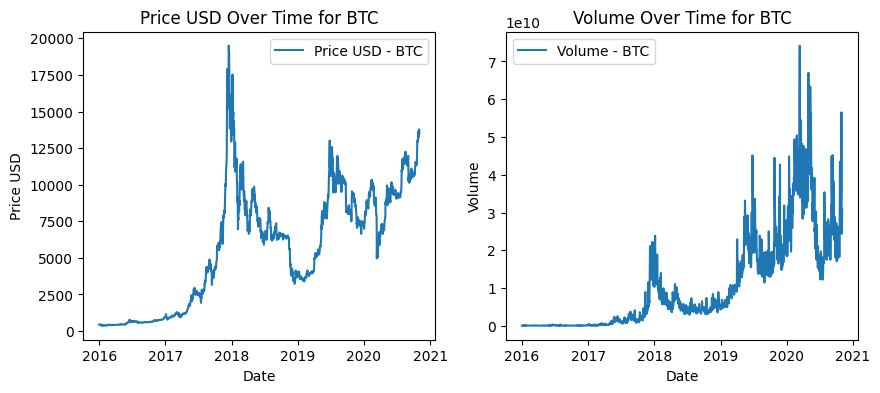

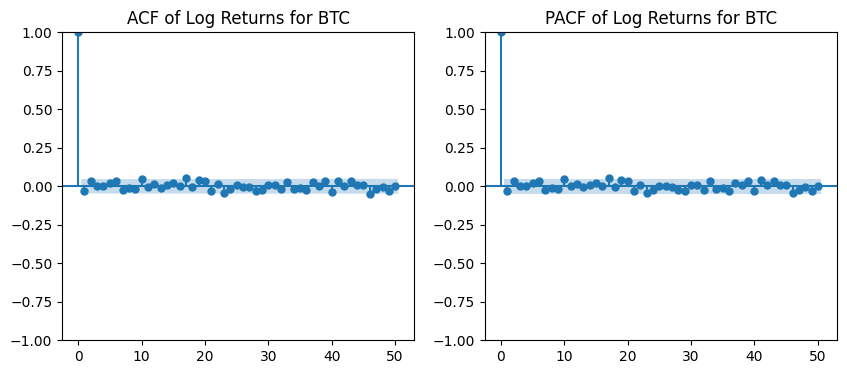

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 23025.363813879725
Iteration:      2,   Func. Count:     16,   Neg. LLF: 7138.528268056956
Iteration:      3,   Func. Count:     26,   Neg. LLF: 1116.9228550462176
Iteration:      4,   Func. Count:     33,   Neg. LLF: 1114.202936421307
Iteration:      5,   Func. Count:     40,   Neg. LLF: 531.6090867435867
Iteration:      6,   Func. Count:     46,   Neg. LLF: 531.0069376375607
Iteration:      7,   Func. Count:     51,   Neg. LLF: 530.9291797713536
Iteration:      8,   Func. Count:     56,   Neg. LLF: 530.9244214831743
Iteration:      9,   Func. Count:     61,   Neg. LLF: 530.9243172807262
Iteration:     10,   Func. Count:     66,   Neg. LLF: 530.9243102320555
Iteration:     11,   Func. Count:     71,   Neg. LLF: 530.9243096939089
Optimization terminated successfully    (Exit mode 0)
            Current function value: 530.9243096939089
            Iterations: 11
            Function evaluations: 71
            Gradient evaluations: 

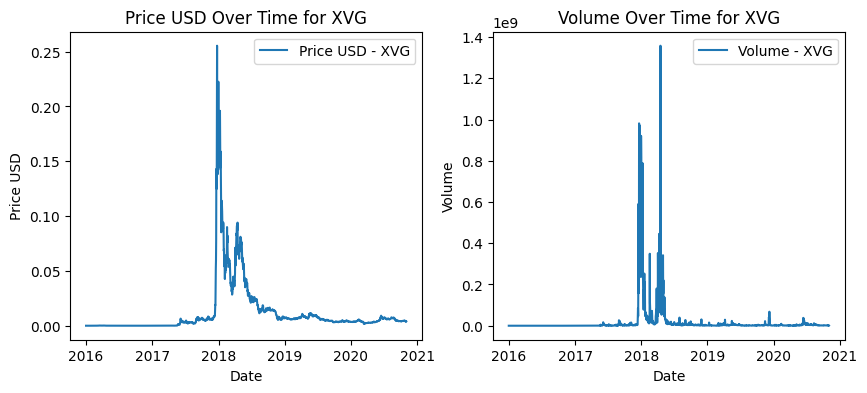

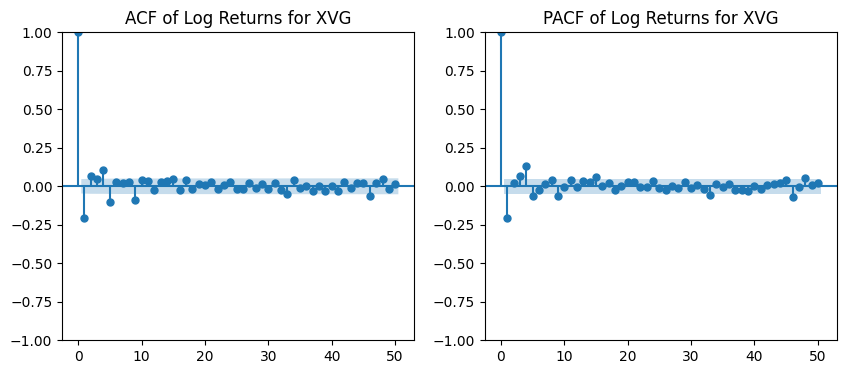

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 19068359592475.594
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3919165.5158033688
Iteration:      3,   Func. Count:     22,   Neg. LLF: 2151.799303597053
Iteration:      4,   Func. Count:     28,   Neg. LLF: 2151.278763720268
Iteration:      5,   Func. Count:     34,   Neg. LLF: 2518.3408331888295
Iteration:      6,   Func. Count:     40,   Neg. LLF: 2148.948558730199
Iteration:      7,   Func. Count:     46,   Neg. LLF: 2132.5037049630946
Iteration:      8,   Func. Count:     51,   Neg. LLF: 2132.881569229583
Iteration:      9,   Func. Count:     57,   Neg. LLF: 4327.413539736541
Iteration:     10,   Func. Count:     64,   Neg. LLF: 2133.567834175401
Iteration:     11,   Func. Count:     71,   Neg. LLF: 2132.3125313919973
Iteration:     12,   Func. Count:     76,   Neg. LLF: 2132.3123375857367
Iteration:     13,   Func. Count:     81,   Neg. LLF: 2132.3123353776746
Iteration:     14,   Func. Count:     85,   Neg. LLF: 213

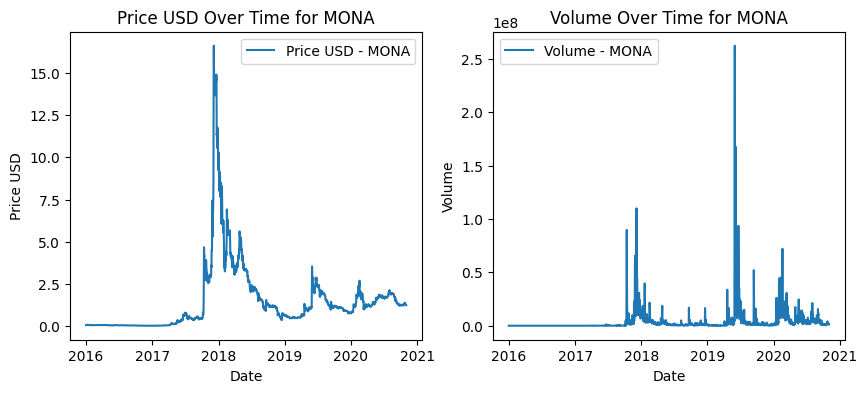

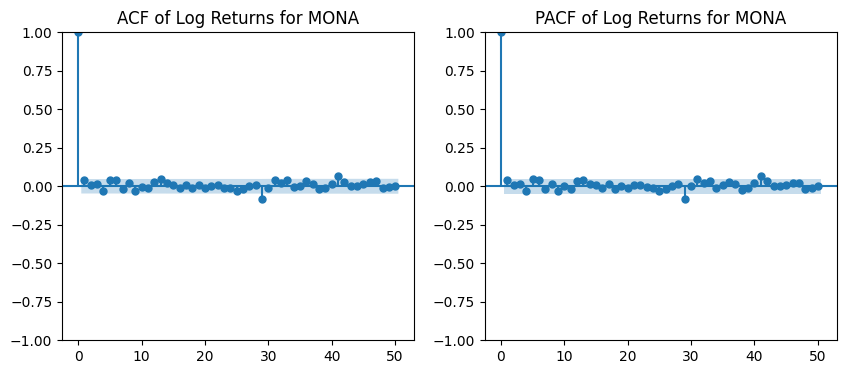

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 16078.292854075065
Iteration:      2,   Func. Count:     15,   Neg. LLF: 486742.2426175849
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1577.6684194574277
Iteration:      4,   Func. Count:     32,   Neg. LLF: 2073.4978778443087
Iteration:      5,   Func. Count:     38,   Neg. LLF: 1510.2189655418615
Iteration:      6,   Func. Count:     43,   Neg. LLF: 1513.320954731188
Iteration:      7,   Func. Count:     49,   Neg. LLF: 1712.0455182343535
Iteration:      8,   Func. Count:     57,   Neg. LLF: 1509.0721471557754
Iteration:      9,   Func. Count:     62,   Neg. LLF: 1509.0629913500984
Iteration:     10,   Func. Count:     67,   Neg. LLF: 1509.062632187621
Iteration:     11,   Func. Count:     72,   Neg. LLF: 1509.0626291503254
Iteration:     12,   Func. Count:     76,   Neg. LLF: 1509.062628231588
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1509.0626291503254
            Iterati

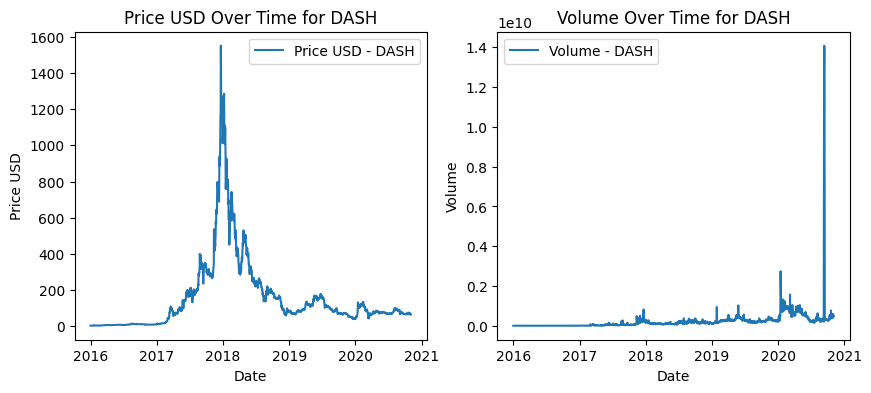

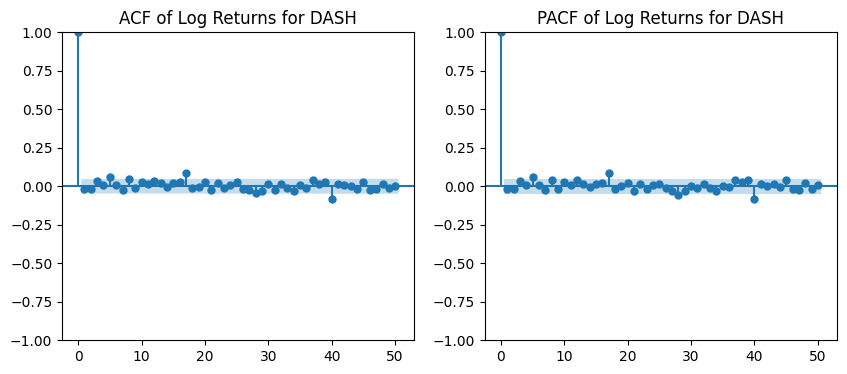

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 39716.88483639963
Iteration:      2,   Func. Count:     16,   Neg. LLF: 6507.201577006897
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1168.1526102255987
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1215.0457086826436
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1114.1193544197515
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1321.8151454548818
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1140.148746470643
Iteration:      8,   Func. Count:     55,   Neg. LLF: 1113.2570908515406
Iteration:      9,   Func. Count:     60,   Neg. LLF: 1113.243657003024
Iteration:     10,   Func. Count:     65,   Neg. LLF: 1113.2435170835593
Iteration:     11,   Func. Count:     70,   Neg. LLF: 1113.2435164072676
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1113.2435164072676
            Iterations: 11
            Function evaluations: 70
            Gradient evaluat

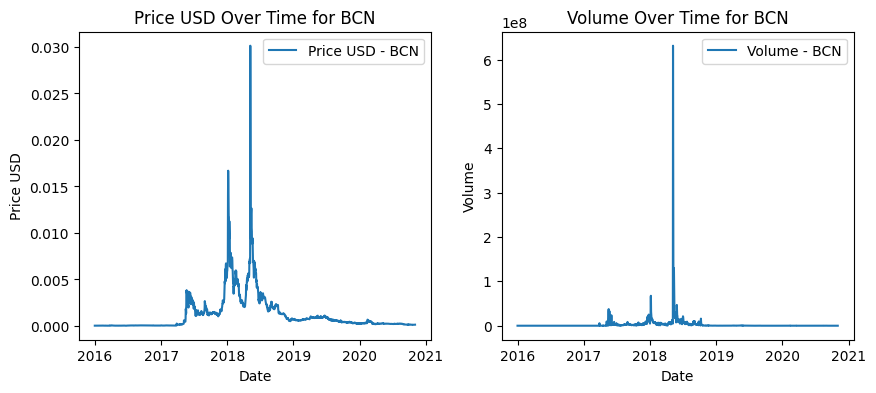

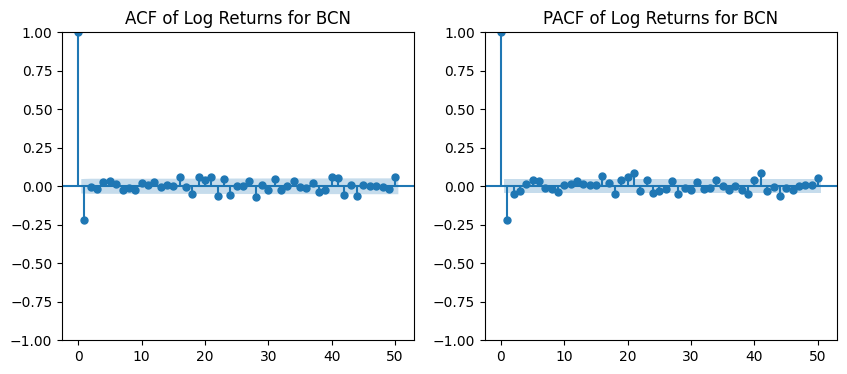

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 10139.303276636834
Iteration:      2,   Func. Count:     17,   Neg. LLF: 7855.188205906645
Iteration:      3,   Func. Count:     26,   Neg. LLF: 2308.782039713408
Iteration:      4,   Func. Count:     33,   Neg. LLF: 1957.234847588526
Iteration:      5,   Func. Count:     38,   Neg. LLF: 1957.6196643880548
Iteration:      6,   Func. Count:     44,   Neg. LLF: 1956.9844356095607
Iteration:      7,   Func. Count:     49,   Neg. LLF: 1956.9630689766477
Iteration:      8,   Func. Count:     54,   Neg. LLF: 1956.962145934995
Iteration:      9,   Func. Count:     59,   Neg. LLF: 1956.962136859631
Iteration:     10,   Func. Count:     63,   Neg. LLF: 1956.96213085125
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1956.962136859631
            Iterations: 10
            Function evaluations: 63
            Gradient evaluations: 10
11/11 [==============================] - 1s 5ms/step
BCN - ARMA-GARC

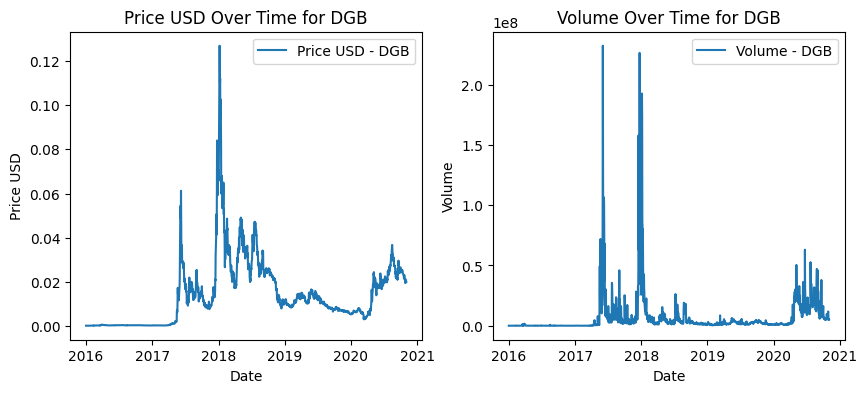

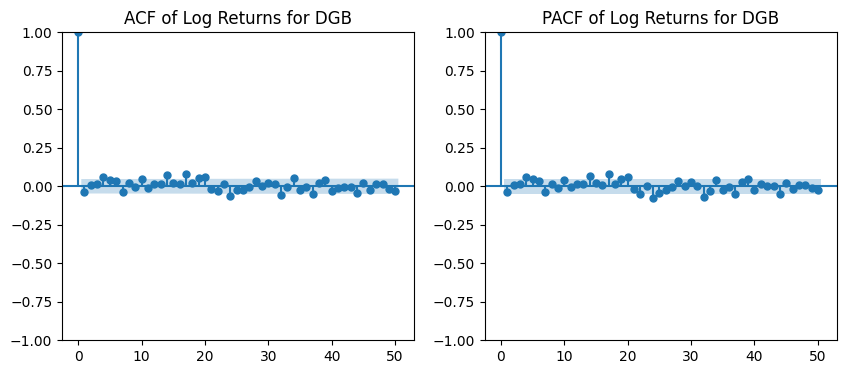

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 17772622201364.258
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1880880.9000650612
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1683.2537712645208
Iteration:      4,   Func. Count:     28,   Neg. LLF: 2576.7730913218525
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1680.979316641838
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1666.3853278812294
Iteration:      7,   Func. Count:     45,   Neg. LLF: 1749.155811280127
Iteration:      8,   Func. Count:     51,   Neg. LLF: 2419.4675718313756
Iteration:      9,   Func. Count:     58,   Neg. LLF: 1666.5479965653128
Iteration:     10,   Func. Count:     64,   Neg. LLF: 1666.0826515213953
Iteration:     11,   Func. Count:     69,   Neg. LLF: 1666.0820429677933
Iteration:     12,   Func. Count:     74,   Neg. LLF: 1666.0818948493036
Iteration:     13,   Func. Count:     79,   Neg. LLF: 1666.0818924547589
Iteration:     14,   Func. Count:     83,   Neg. LLF:

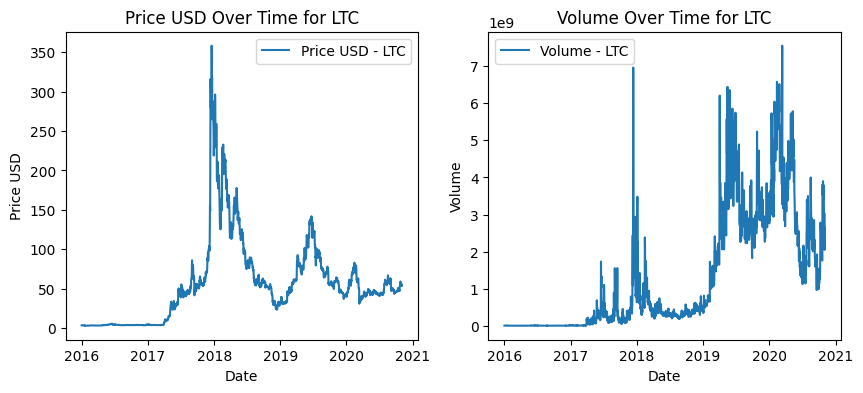

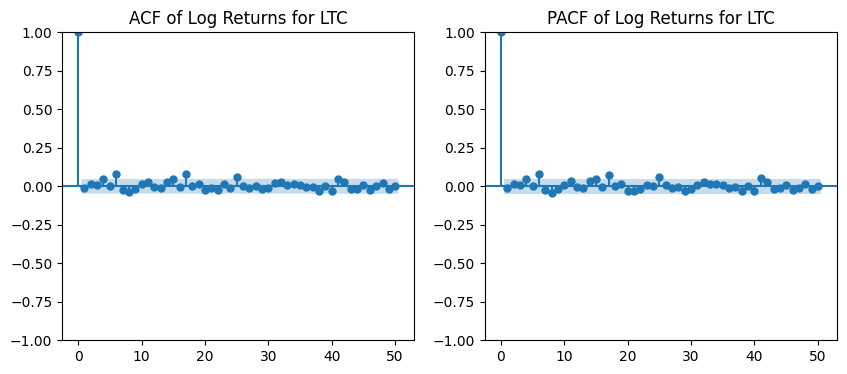

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 17651.350718645404
Iteration:      2,   Func. Count:     16,   Neg. LLF: 12950.329062682087
Iteration:      3,   Func. Count:     25,   Neg. LLF: 1754.1433535299882
Iteration:      4,   Func. Count:     33,   Neg. LLF: 1431.4829840979842
Iteration:      5,   Func. Count:     40,   Neg. LLF: 1082.2409789820424
Iteration:      6,   Func. Count:     45,   Neg. LLF: 1082.0008523649867
Iteration:      7,   Func. Count:     50,   Neg. LLF: 1082.0003671255624
Iteration:      8,   Func. Count:     55,   Neg. LLF: 1082.0003287143554
Iteration:      9,   Func. Count:     60,   Neg. LLF: 1082.0003273690422
Iteration:     10,   Func. Count:     64,   Neg. LLF: 1082.0003273677419
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1082.0003273690422
            Iterations: 10
            Function evaluations: 64
            Gradient evaluations: 10
11/11 [==============================] - 1s 4ms/step
LTC - A

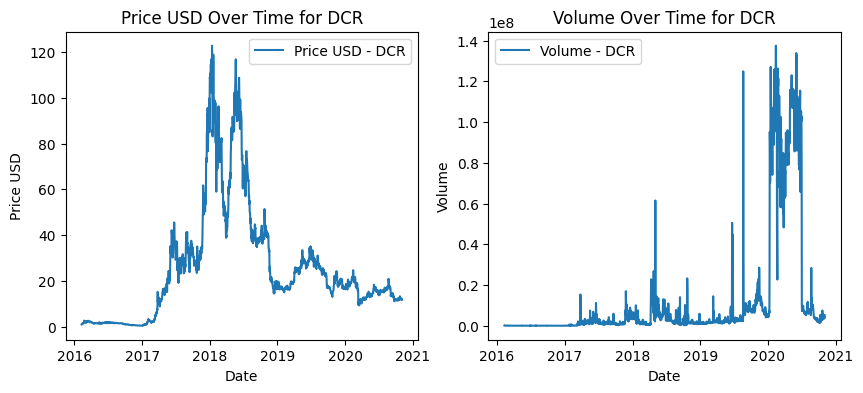

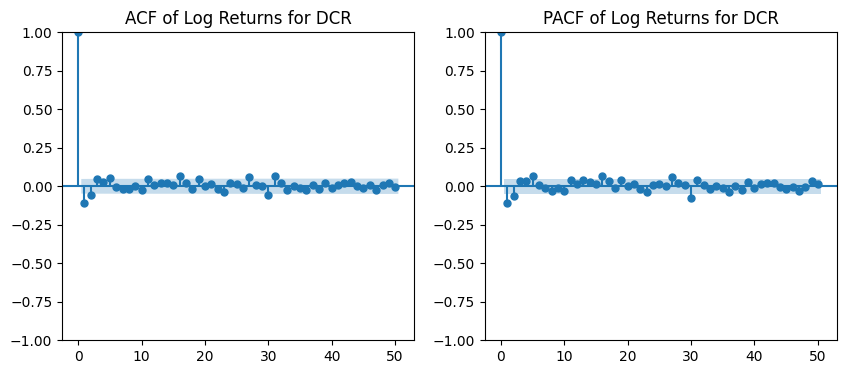

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 18292132782.754547
Iteration:      2,   Func. Count:     15,   Neg. LLF: 1771682174.0026236
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1427.709511885008
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1426.6625127232116
Iteration:      5,   Func. Count:     35,   Neg. LLF: 2091.2658317148316
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1426.8448253006836
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1470.3242483690249
Iteration:      8,   Func. Count:     53,   Neg. LLF: 1425.121826284449
Iteration:      9,   Func. Count:     59,   Neg. LLF: 1411.5516202806016
Iteration:     10,   Func. Count:     65,   Neg. LLF: 1411.414234998157
Iteration:     11,   Func. Count:     71,   Neg. LLF: 1411.4118184717834
Iteration:     12,   Func. Count:     76,   Neg. LLF: 1411.4118155081514
Iteration:     13,   Func. Count:     80,   Neg. LLF: 1411.411815508673
Optimization terminated successfully    (Exit mode 0)
 

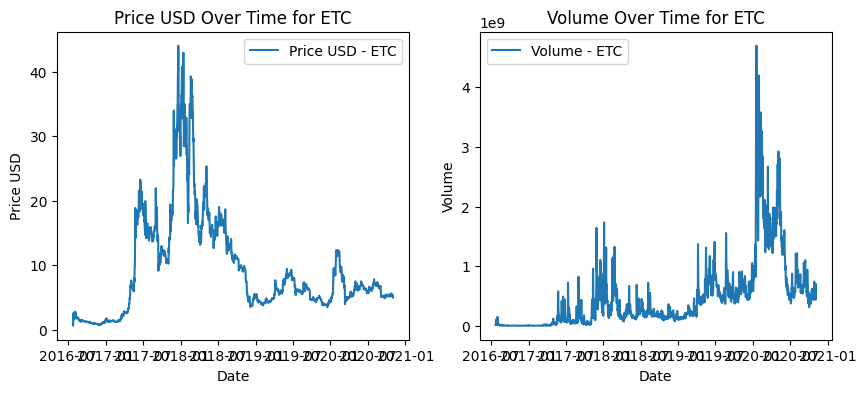

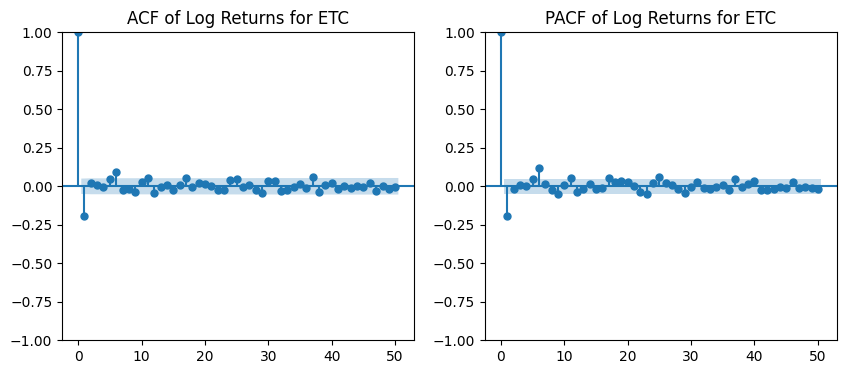

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 493572762873.93195
Iteration:      2,   Func. Count:     15,   Neg. LLF: 728315746.9019487
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1461.7634114513087
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1188.355918061356
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1828.7903228132523
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1270.1287996999154
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1173.2387690686764
Iteration:      8,   Func. Count:     52,   Neg. LLF: 1173.2455949726846
Iteration:      9,   Func. Count:     58,   Neg. LLF: 1173.2130997778256
Iteration:     10,   Func. Count:     62,   Neg. LLF: 1173.2130997776967
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1173.2130997778256
            Iterations: 10
            Function evaluations: 62
            Gradient evaluations: 10
10/10 [==============================] - 1s 5ms/step
ETC - ARM

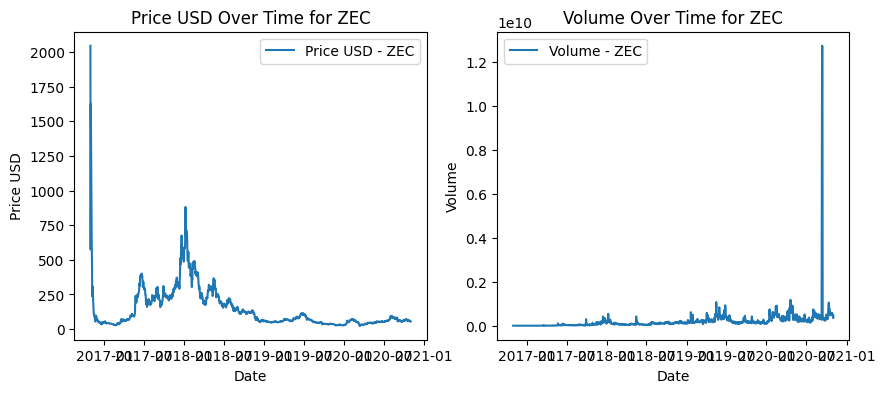

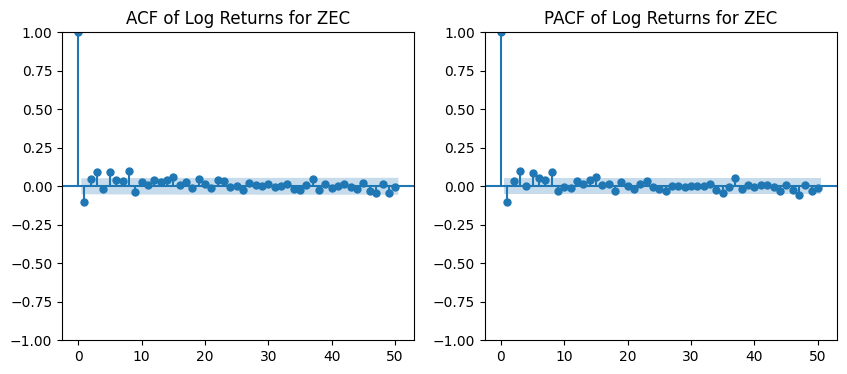

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 88013015607.87494
Iteration:      2,   Func. Count:     15,   Neg. LLF: 842795452.0905552
Iteration:      3,   Func. Count:     22,   Neg. LLF: 1570.49044066469
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1621.463862826511
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1095.2283341288703
Iteration:      6,   Func. Count:     43,   Neg. LLF: 1086.4666993894075
Iteration:      7,   Func. Count:     49,   Neg. LLF: 1086.441289064067
Iteration:      8,   Func. Count:     54,   Neg. LLF: 1086.4410561035468
Iteration:      9,   Func. Count:     59,   Neg. LLF: 1086.4410543590595
Iteration:     10,   Func. Count:     63,   Neg. LLF: 1086.4410543592744
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1086.4410543590595
            Iterations: 10
            Function evaluations: 63
            Gradient evaluations: 10
9/9 [==============================] - 1s 5ms/step
ZEC - ARMA-GARC

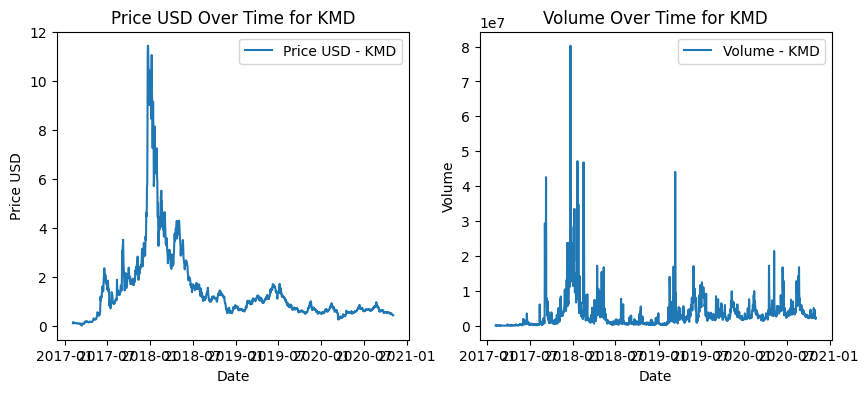

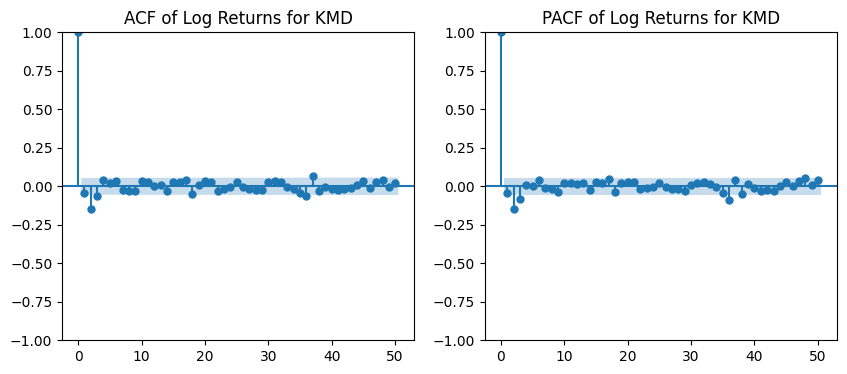

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 9892.400823340999
Iteration:      2,   Func. Count:     17,   Neg. LLF: 5961.557779422516
Iteration:      3,   Func. Count:     27,   Neg. LLF: 2141.810350012469
Iteration:      4,   Func. Count:     34,   Neg. LLF: 1538.4901189300977
Iteration:      5,   Func. Count:     40,   Neg. LLF: 1277.5209572011581
Iteration:      6,   Func. Count:     45,   Neg. LLF: 1277.6131588006447
Iteration:      7,   Func. Count:     51,   Neg. LLF: 1276.7852775777442
Iteration:      8,   Func. Count:     56,   Neg. LLF: 1276.7258863277234
Iteration:      9,   Func. Count:     61,   Neg. LLF: 1276.7196266979083
Iteration:     10,   Func. Count:     66,   Neg. LLF: 1276.7193470979914
Iteration:     11,   Func. Count:     71,   Neg. LLF: 1276.71934473261
Iteration:     12,   Func. Count:     75,   Neg. LLF: 1276.7193447328264
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1276.71934473261
            Iterations

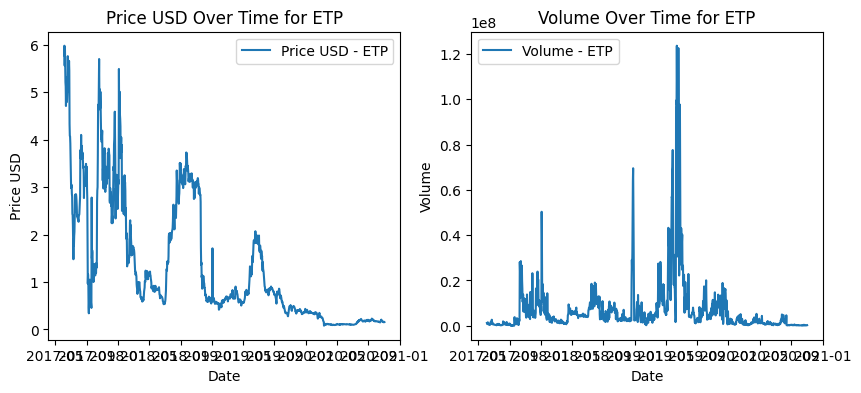

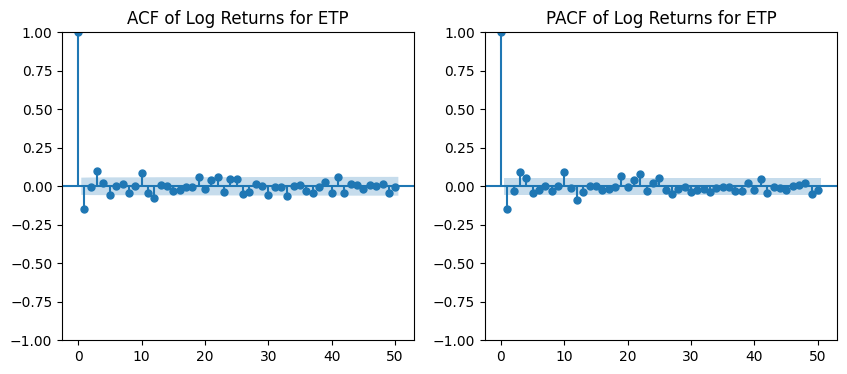

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 846411174144.7659
Iteration:      2,   Func. Count:     14,   Neg. LLF: 81404.22535772175
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1515.3774801264394
Iteration:      4,   Func. Count:     29,   Neg. LLF: 2792.54097617947
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1635.1169232898153
Iteration:      6,   Func. Count:     43,   Neg. LLF: 1371.0847727218008
Iteration:      7,   Func. Count:     48,   Neg. LLF: 1371.0135365290257
Iteration:      8,   Func. Count:     53,   Neg. LLF: 1371.0120470463091
Iteration:      9,   Func. Count:     58,   Neg. LLF: 1371.0119691080317
Iteration:     10,   Func. Count:     62,   Neg. LLF: 1371.01196910821
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1371.0119691080317
            Iterations: 10
            Function evaluations: 62
            Gradient evaluations: 10
8/8 [==============================] - 1s 6ms/step
ETP - ARMA-GARC

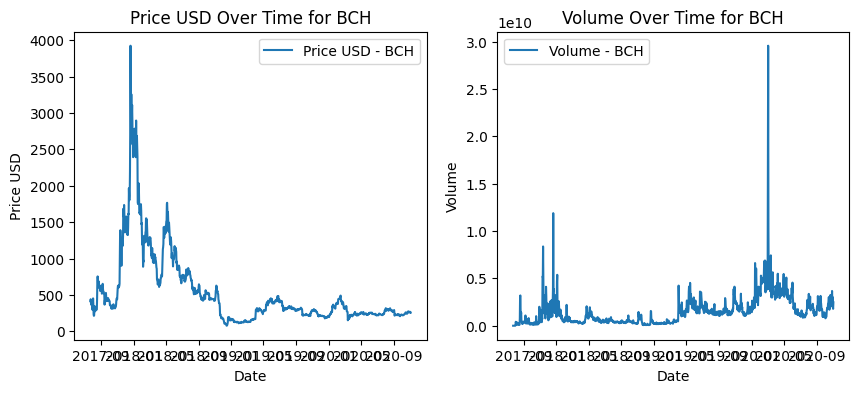

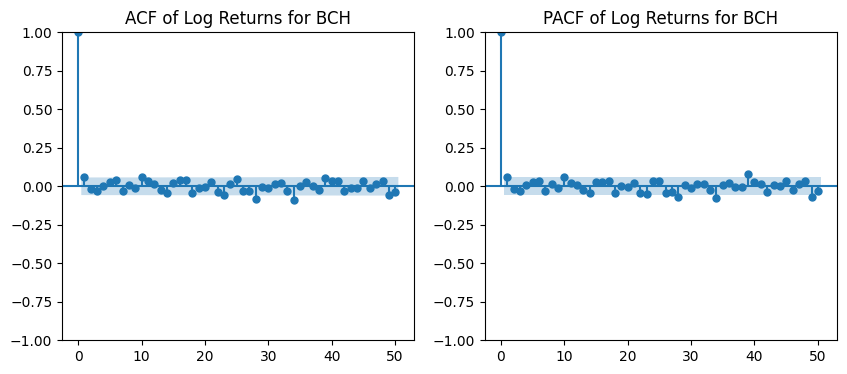

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 493755617101.1154
Iteration:      2,   Func. Count:     14,   Neg. LLF: 690389010.728936
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1252.4668397771677
Iteration:      4,   Func. Count:     28,   Neg. LLF: 1092.2561814636722
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1148.6815016406317
Iteration:      6,   Func. Count:     41,   Neg. LLF: 1023.9592882812784
Iteration:      7,   Func. Count:     46,   Neg. LLF: 1023.9327498825056
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1023.9228687728119
Iteration:      9,   Func. Count:     56,   Neg. LLF: 1023.9226271712217
Iteration:     10,   Func. Count:     61,   Neg. LLF: 1023.9222430635325
Iteration:     11,   Func. Count:     65,   Neg. LLF: 1023.9222430628897
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1023.9222430635325
            Iterations: 11
            Function evaluations: 65
            Gradient evalua

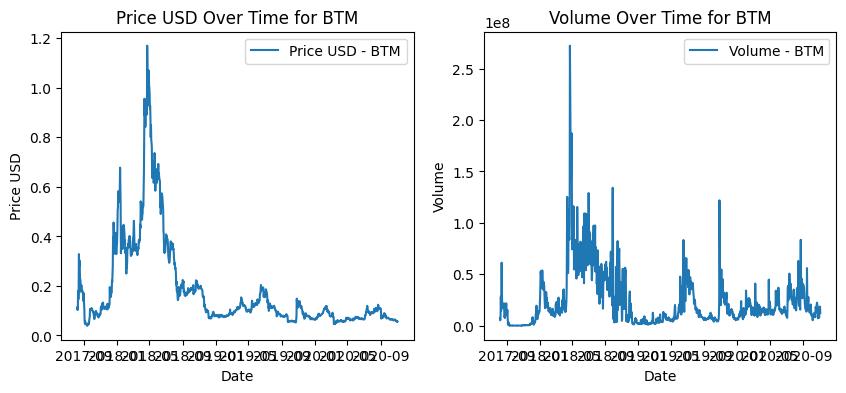

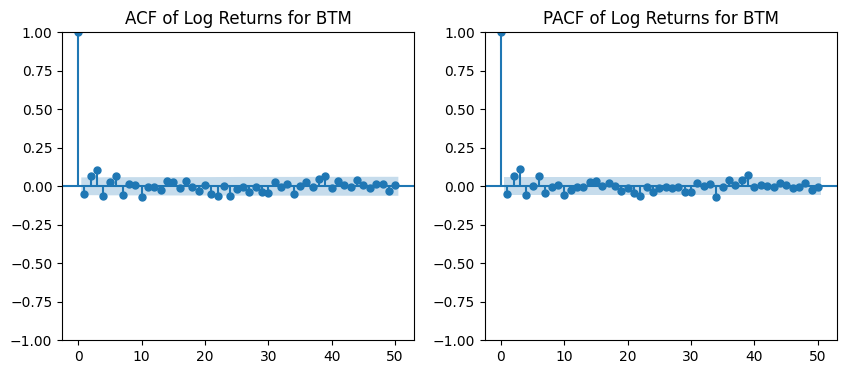

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4461.434132634081
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3091.8296259468702
Iteration:      3,   Func. Count:     23,   Neg. LLF: 1304.3972482393256
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1372.2179118578451
Iteration:      5,   Func. Count:     37,   Neg. LLF: 1048.026863088161
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1048.02655143036
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1048.026540644806
Iteration:      8,   Func. Count:     51,   Neg. LLF: 1048.0265406448036
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1048.026540644806
            Iterations: 8
            Function evaluations: 51
            Gradient evaluations: 8
8/8 [==============================] - 1s 5ms/step
BTM - ARMA-GARCH RMSE: 0.09713819087381764
BTM - XGBoost RMSE: 0.01412814718501386
BTM - LSTM RMSE: 0.1404292435614664
Analyzing ADA


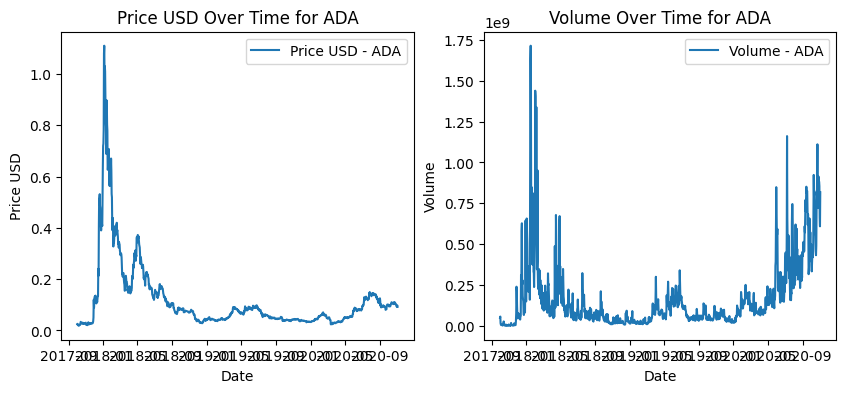

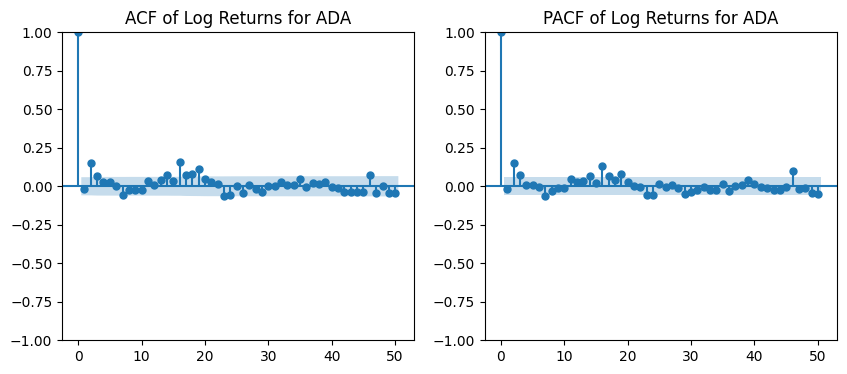

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4814.659271335656
Iteration:      2,   Func. Count:     16,   Neg. LLF: 4356.667044231943
Iteration:      3,   Func. Count:     26,   Neg. LLF: 6645.769333922348
Iteration:      4,   Func. Count:     32,   Neg. LLF: 901.154112562187
Iteration:      5,   Func. Count:     38,   Neg. LLF: 1004.3793472455527
Iteration:      6,   Func. Count:     45,   Neg. LLF: 900.1778685420182
Iteration:      7,   Func. Count:     51,   Neg. LLF: 900.1157493853683
Iteration:      8,   Func. Count:     56,   Neg. LLF: 900.1155932155033
Iteration:      9,   Func. Count:     60,   Neg. LLF: 900.1155932145346
Optimization terminated successfully    (Exit mode 0)
            Current function value: 900.1155932155033
            Iterations: 9
            Function evaluations: 60
            Gradient evaluations: 9
7/7 [==============================] - 1s 6ms/step
ADA - ARMA-GARCH RMSE: 0.11962599999799911
ADA - XGBoost RMSE: 0.01443947521627255
ADA - LSTM 

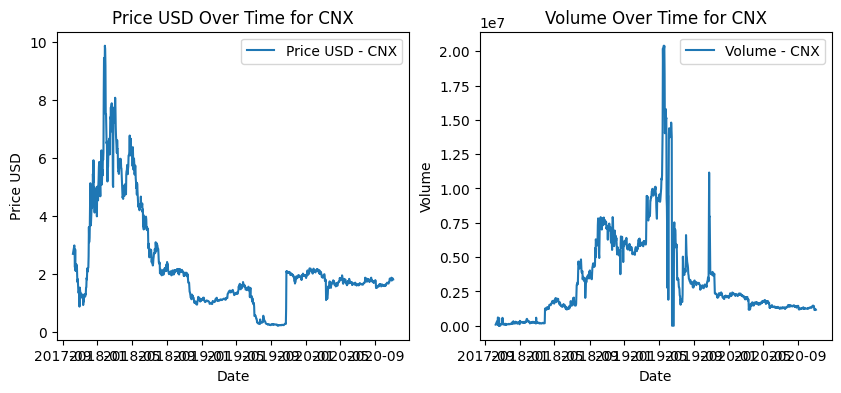

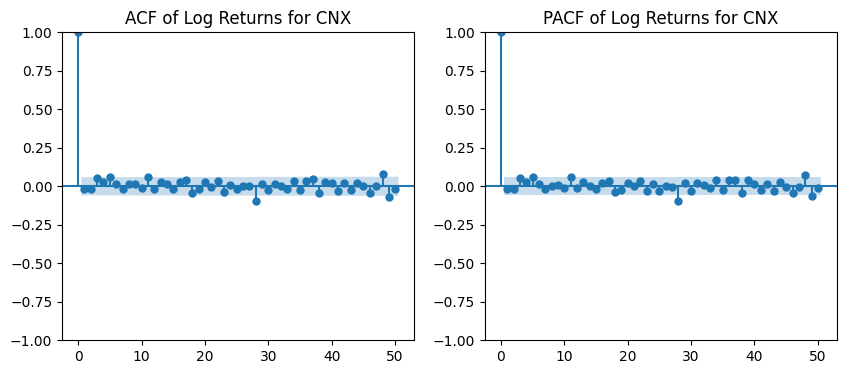

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 670335.6466447165
Iteration:      2,   Func. Count:     13,   Neg. LLF: 2946.629825473773
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1038.5144119715587
Iteration:      4,   Func. Count:     29,   Neg. LLF: 1015.4032717718044
Iteration:      5,   Func. Count:     34,   Neg. LLF: 1016.8392821724835
Iteration:      6,   Func. Count:     40,   Neg. LLF: 1105.8661030676244
Iteration:      7,   Func. Count:     47,   Neg. LLF: 1011.022695943964
Iteration:      8,   Func. Count:     52,   Neg. LLF: 1010.9639874571144
Iteration:      9,   Func. Count:     57,   Neg. LLF: 1010.9548681777451
Iteration:     10,   Func. Count:     62,   Neg. LLF: 1010.9545019409559
Iteration:     11,   Func. Count:     67,   Neg. LLF: 1010.9544999947493
Iteration:     12,   Func. Count:     71,   Neg. LLF: 1010.9544995866991
Optimization terminated successfully    (Exit mode 0)
            Current function value: 1010.9544999947493
            Iterat

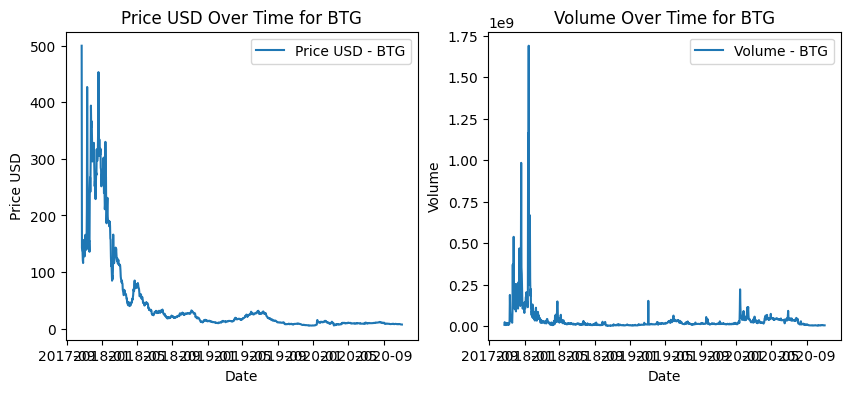

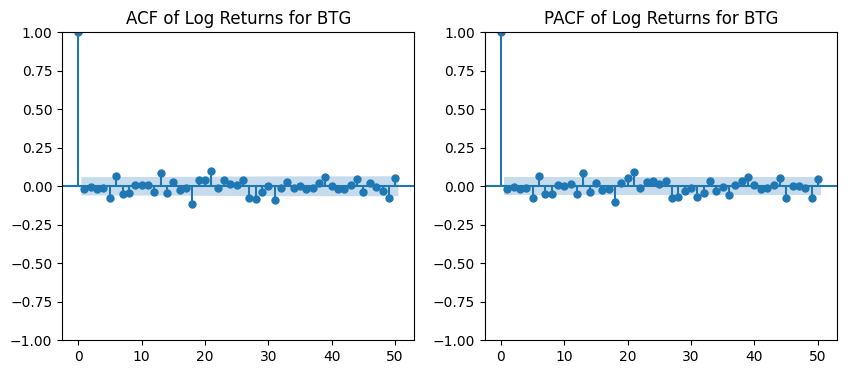

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 439831006137.085
Iteration:      2,   Func. Count:     14,   Neg. LLF: 619231226.8972011
Iteration:      3,   Func. Count:     21,   Neg. LLF: 1037.8104126898925
Iteration:      4,   Func. Count:     27,   Neg. LLF: 1004.1053509336479
Iteration:      5,   Func. Count:     33,   Neg. LLF: 1115.7820608532372
Iteration:      6,   Func. Count:     39,   Neg. LLF: 932.3842600228264
Iteration:      7,   Func. Count:     45,   Neg. LLF: 939.1371965563236
Iteration:      8,   Func. Count:     51,   Neg. LLF: 929.153327740508
Iteration:      9,   Func. Count:     56,   Neg. LLF: 929.1411537010719
Iteration:     10,   Func. Count:     61,   Neg. LLF: 929.1403505580666
Iteration:     11,   Func. Count:     66,   Neg. LLF: 929.1399874531099
Iteration:     12,   Func. Count:     71,   Neg. LLF: 929.1399827346814
Iteration:     13,   Func. Count:     75,   Neg. LLF: 929.1399827356884
Optimization terminated successfully    (Exit mode 0)
         

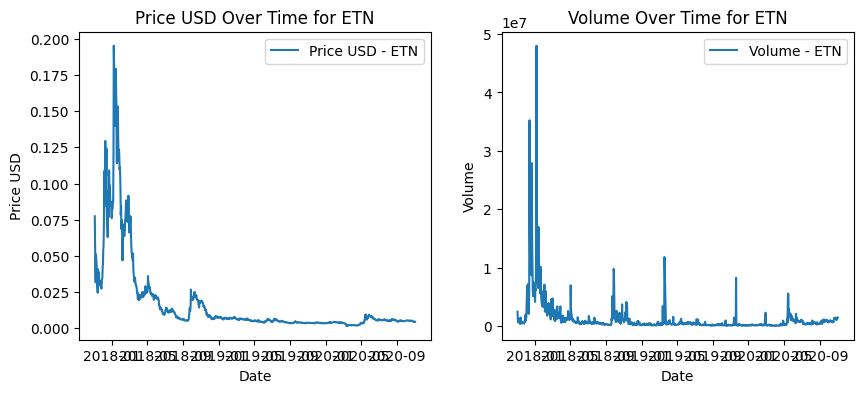

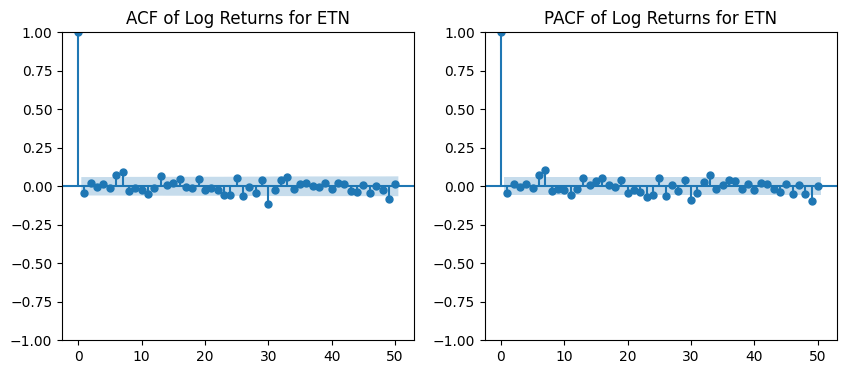

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 5096.894276270136
Iteration:      2,   Func. Count:     16,   Neg. LLF: 41089597139.64567
Iteration:      3,   Func. Count:     24,   Neg. LLF: 2195.624500649105
Iteration:      4,   Func. Count:     31,   Neg. LLF: 1144.0882269565907
Iteration:      5,   Func. Count:     39,   Neg. LLF: 931.3790651579196
Iteration:      6,   Func. Count:     44,   Neg. LLF: 931.3759980945226
Iteration:      7,   Func. Count:     49,   Neg. LLF: 931.3758772884192
Iteration:      8,   Func. Count:     54,   Neg. LLF: 931.3758736550944
Iteration:      9,   Func. Count:     58,   Neg. LLF: 931.3758736557866
Optimization terminated successfully    (Exit mode 0)
            Current function value: 931.3758736550944
            Iterations: 9
            Function evaluations: 58
            Gradient evaluations: 9
7/7 [==============================] - 1s 9ms/step
ETN - ARMA-GARCH RMSE: 0.0978384428350671
ETN - XGBoost RMSE: 0.008064215862067452
ETN - LSTM

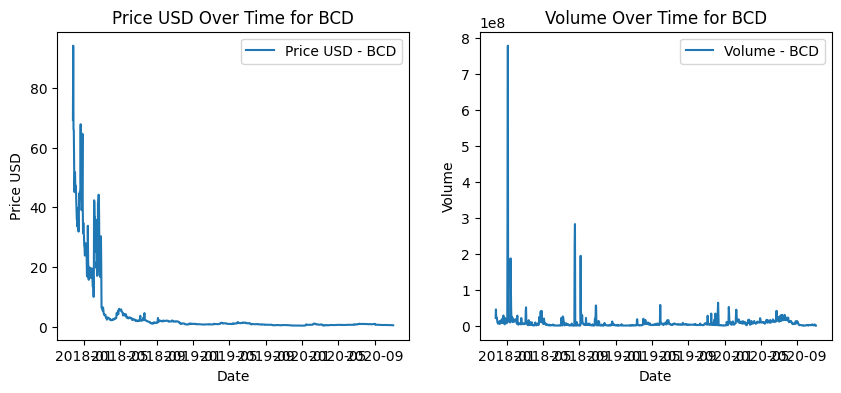

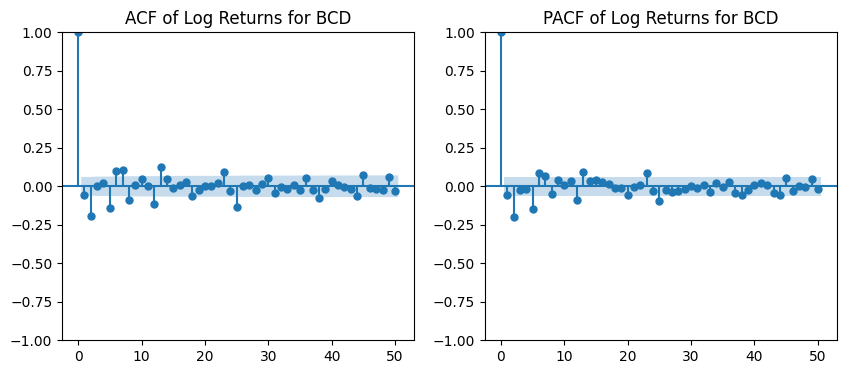

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4705.154959764122
Iteration:      2,   Func. Count:     16,   Neg. LLF: 274275348145.40506
Iteration:      3,   Func. Count:     24,   Neg. LLF: 1190.7828119027083
Iteration:      4,   Func. Count:     30,   Neg. LLF: 1190.8515559325094
Iteration:      5,   Func. Count:     36,   Neg. LLF: 1190.3399923147686
Iteration:      6,   Func. Count:     42,   Neg. LLF: 1432.5042761464506
Iteration:      7,   Func. Count:     48,   Neg. LLF: 17591919032.21722
Iteration:      8,   Func. Count:     56,   Neg. LLF: 178562620455.826
Iteration:      9,   Func. Count:     65,   Neg. LLF: 1193.0980352338584
Iteration:     10,   Func. Count:     71,   Neg. LLF: 1192.4906558215728
Iteration:     11,   Func. Count:     77,   Neg. LLF: 1195.9826055220797
Iteration:     12,   Func. Count:     83,   Neg. LLF: 1167.8017132836796
Iteration:     13,   Func. Count:     89,   Neg. LLF: 1740.5958248402815
Iteration:     14,   Func. Count:     95,   Neg. LLF: 1

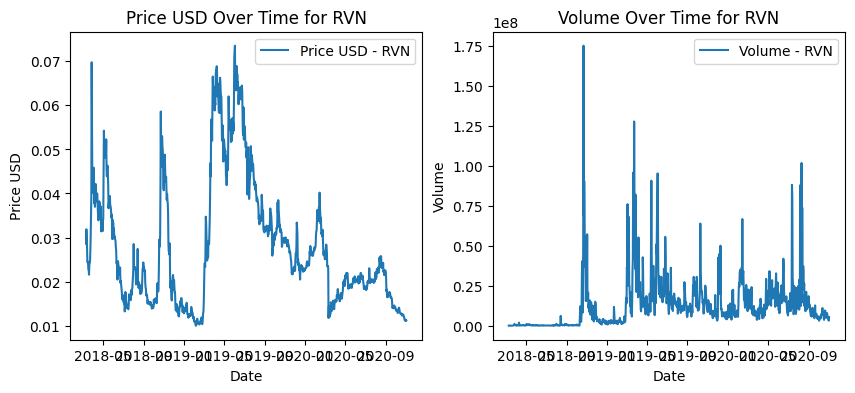

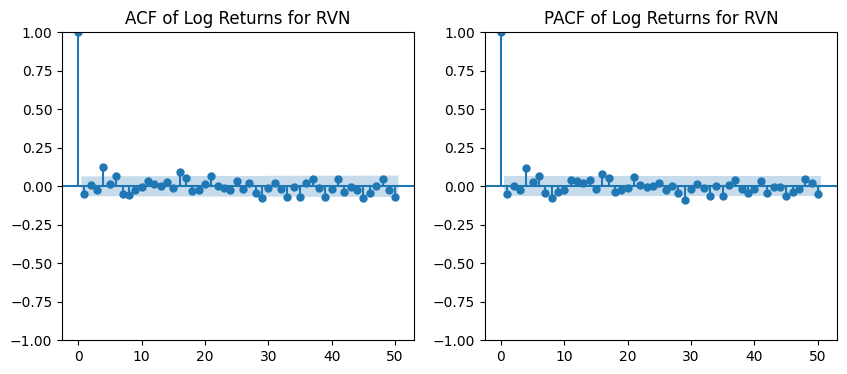

<ipython-input-51-bee416ada760>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train['log_returns_scaled'] = train['log_returns'] * scale_factor
<ipython-input-51-bee416ada760>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test['log_returns_scaled'] = test['log_returns'] * scale_factor
/usr/local/lib/python3.10/dist-packages/statsmodels/tsa/base/tsa_model.py:473: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  

Iteration:      1,   Func. Count:      6,   Neg. LLF: 4015.361653437666
Iteration:      2,   Func. Count:     15,   Neg. LLF: 3522.453066351334
Iteration:      3,   Func. Count:     24,   Neg. LLF: 936.4011544592913
Iteration:      4,   Func. Count:     30,   Neg. LLF: 889.7746882336037
Iteration:      5,   Func. Count:     36,   Neg. LLF: 874.2162918066757
Iteration:      6,   Func. Count:     42,   Neg. LLF: 954.3579996181127
Iteration:      7,   Func. Count:     48,   Neg. LLF: 864.1163274063542
Iteration:      8,   Func. Count:     53,   Neg. LLF: 864.0924865128917
Iteration:      9,   Func. Count:     58,   Neg. LLF: 864.0916115171051
Iteration:     10,   Func. Count:     63,   Neg. LLF: 864.0915979842101
Iteration:     11,   Func. Count:     68,   Neg. LLF: 864.0915939560675
Iteration:     12,   Func. Count:     72,   Neg. LLF: 864.0915939559563
Optimization terminated successfully    (Exit mode 0)
            Current function value: 864.0915939560675
            Iterations: 12
 

In [54]:
for ticker in data['ticker'].unique():
    print(f'Analyzing {ticker}')
    df_ticker = data[data['ticker'] == ticker].copy()
    df_ticker = feature_engineering(df_ticker)

    # Data Visualization & ACF, PACF
    visualize_data(df_ticker, ticker)

    # ACF and PACF plots
    plot_acf_pacf(df_ticker, ticker)

    # Split data
    train_size = int(len(df_ticker) * 0.8)
    train, test = df_ticker.iloc[:train_size], df_ticker.iloc[train_size:]

    # ARMA-GARCH Modeling
    arma_garch_predictions = run_arma_garch(train, test)

    # Machine Learning Modeling
    X = df_ticker.drop(columns=['price_usd', 'price_btc', 'returns', 'log_returns', 'ticker'])
    y = df_ticker['log_returns']

    # Ensure all columns in X are numeric
    X = X.apply(pd.to_numeric, errors='coerce')
    X = X.fillna(0)

    # Feature scaling
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Train/test split
    X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, shuffle=False)

    # XGBoost
    xgb_predictions = run_xgboost(X_train, X_test, y_train)

    # Deep Learning Modeling
    df_ticker_numeric = df_ticker.drop(columns=['ticker']).apply(pd.to_numeric, errors='coerce').fillna(0)
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df_ticker_numeric)

    def create_sequences(data, seq_length):
        X, y = [], []
        for i in range(len(data) - seq_length):
            X.append(data[i:i + seq_length])
            y.append(data[i + seq_length])
        return np.array(X), np.array(y)

    seq_length = 10
    X, y = create_sequences(df_scaled, seq_length)

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=False)

    # LSTM
    lstm_predictions = run_lstm(X_train, X_test, y_train)

    # Ensure consistent length for evaluation
    min_length = min(len(test), len(xgb_predictions), len(lstm_predictions))
    test = test.iloc[:min_length]
    xgb_predictions = xgb_predictions[:min_length]
    lstm_predictions = lstm_predictions[:min_length]

    # Evaluation
    arma_garch_rmse = np.sqrt(mean_squared_error(test['log_returns'], arma_garch_predictions[:min_length]))
    xgb_rmse = np.sqrt(mean_squared_error(test['log_returns'], xgb_predictions))
    lstm_rmse = np.sqrt(mean_squared_error(test['log_returns'], lstm_predictions))

    print(f'{ticker} - ARMA-GARCH RMSE: {arma_garch_rmse}')
    print(f'{ticker} - XGBoost RMSE: {xgb_rmse}')
    print(f'{ticker} - LSTM RMSE: {lstm_rmse}')

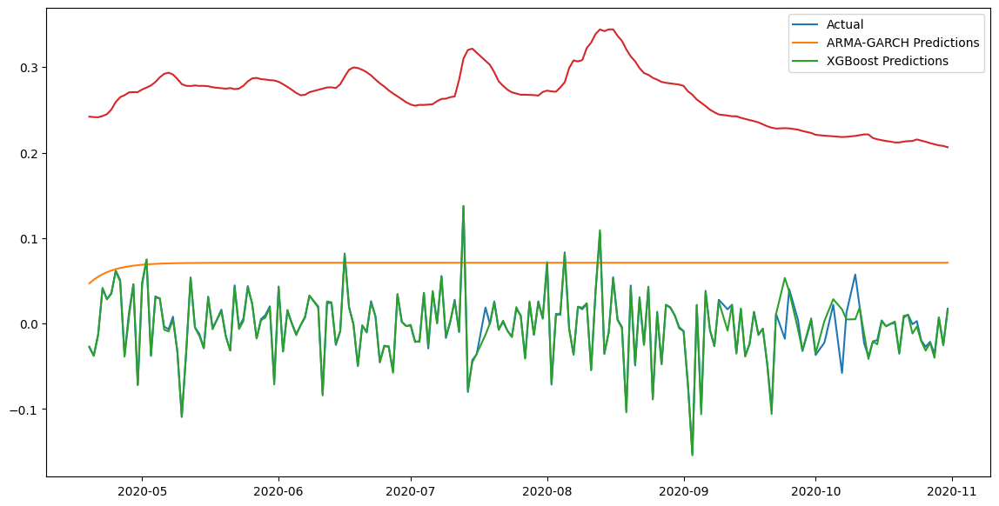

In [58]:
plt.figure(figsize=(14, 7))
plt.plot(test.index, test['log_returns'], label='Actual')
plt.plot(test.index, arma_garch_predictions[:min_length], label='ARMA-GARCH Predictions')
plt.plot(test.index, xgb_predictions, label='XGBoost Predictions')
plt.plot(test.index, lstm_predictions)
plt.legend()
plt.show()


In [64]:
def trading_strategy(predictions, actual, initial_investment=100000):
    signals = pd.DataFrame(index=actual.index)
    signals['predicted_returns'] = predictions
    signals['actual_returns'] = actual

    # Generate trading signals
    signals['signal'] = 0
    signals['signal'][signals['predicted_returns'] > 0] = 1  # Buy signal
    signals['signal'][signals['predicted_returns'] < 0] = -1  # Sell signal

    # Calculate the portfolio value
    signals['holdings'] = signals['signal'].shift() * signals['actual_returns']
    signals['holdings'].fillna(0, inplace=True)

    # Calculate the returns
    signals['cash'] = initial_investment - (signals['signal'].shift() * signals['actual_returns']).cumsum()
    signals['cash'].fillna(initial_investment, inplace=True)

    # Total portfolio value
    signals['portfolio_value'] = signals['cash'] + (signals['holdings'] * initial_investment).cumsum()

    return signals


In [77]:
def predict_next_year_log_returns(data, ticker):
    # Feature engineering
    data = feature_engineering(data)

    # Prepare the dataset
    X = data.drop(columns=['price_usd', 'price_btc', 'returns', 'log_returns', 'ticker', 'max_supply'])
    y = data['log_returns']

    # Ensure all columns in X are numeric
    X = X.apply(pd.to_numeric, errors='coerce')
    X = X.fillna(0)

    # Feature scaling
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Train the XGBoost model on the entire dataset
    xgb_model = xgb.XGBRegressor(objective='reg:squarederror')
    xgb_model.fit(X_scaled, y)

    # Create a DataFrame to hold the future dates
    future_dates = pd.date_range(start=data.index[-1], periods=365, freq='D')[1:]

    # Predict the log returns for the next year
    X_future = pd.DataFrame(index=future_dates, columns=X.columns)

    # Filling the future DataFrame with previous data patterns
    for col in X.columns:
        X_future[col] = X[col].iloc[-len(future_dates):].values

    # Scale the future data
    X_future_scaled = scaler.transform(X_future.fillna(0))

    # Predict future log returns
    future_predictions_log = xgb_model.predict(X_future_scaled)

    # Convert log returns to regular returns
    future_predictions_regular = np.exp(future_predictions_log) - 1

    # Plot the predictions
    plt.figure(figsize=(14, 7))
    plt.plot(data.index, data['log_returns'], label='Historical Log Returns')
    plt.plot(future_dates, future_predictions_log, label='Predicted Log Returns')
    plt.title(f'Predicted Log Returns for the Next Year - {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Log Returns')
    plt.legend()
    plt.show()

    plt.figure(figsize=(14, 7))
    plt.plot(data.index, np.exp(data['log_returns']) - 1, label='Historical Regular Returns')
    plt.plot(future_dates, future_predictions_regular, label='Predicted Regular Returns')
    plt.title(f'Predicted Regular Returns for the Next Year - {ticker}')
    plt.xlabel('Date')
    plt.ylabel('Returns')
    plt.legend()
    plt.show()

    # Create a DataFrame to store future predictions
    future_predictions_df = pd.DataFrame({'datetime': future_dates,
        'predicted_log_returns': future_predictions_log,
        'predicted_regular_returns': future_predictions_regular})

    # Export the future predictions to a CSV file
    future_predictions_df.to_csv(f'{ticker}_future_log_returns_predictions.csv', index=False)

    return future_predictions_log, future_predictions_regular, future_dates


Analyzing BTC


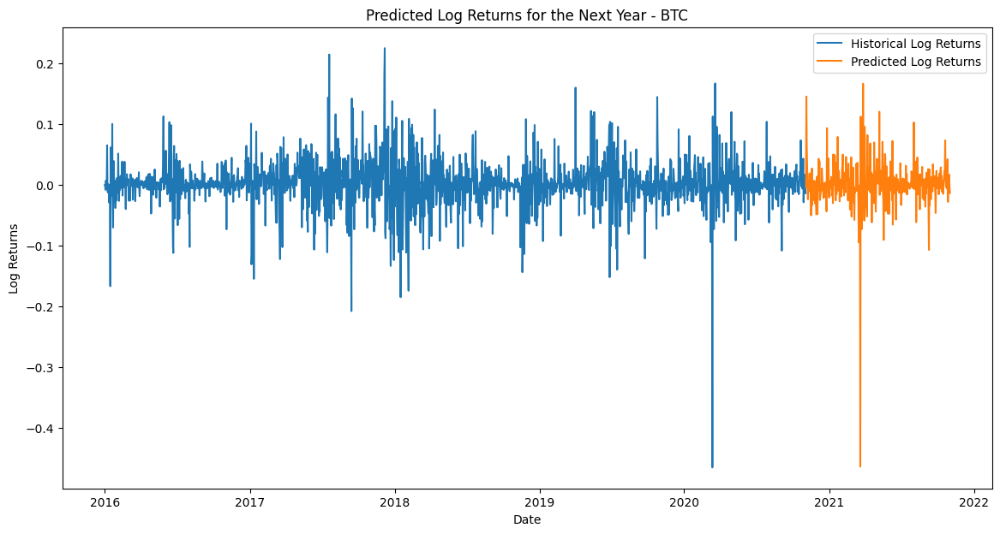

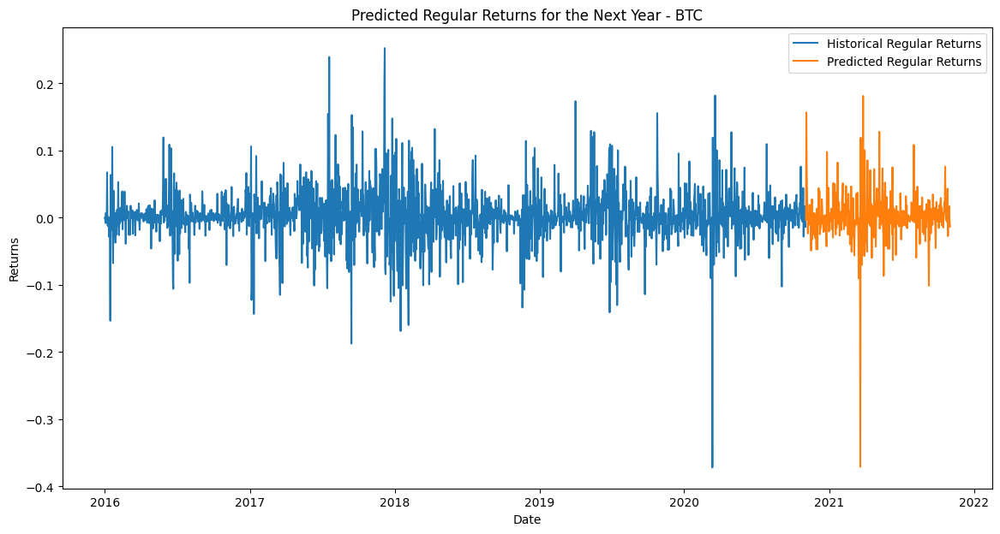

BTC - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing LTC


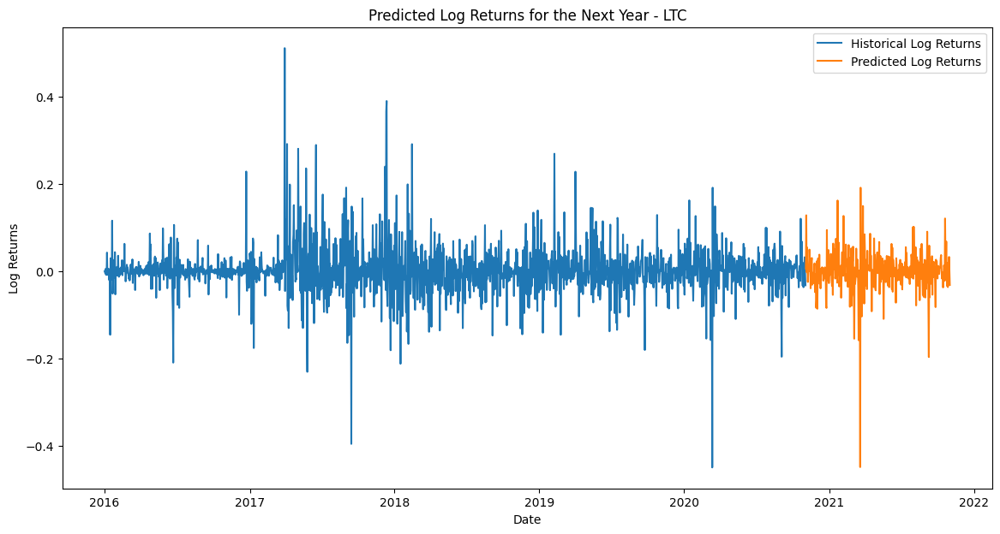

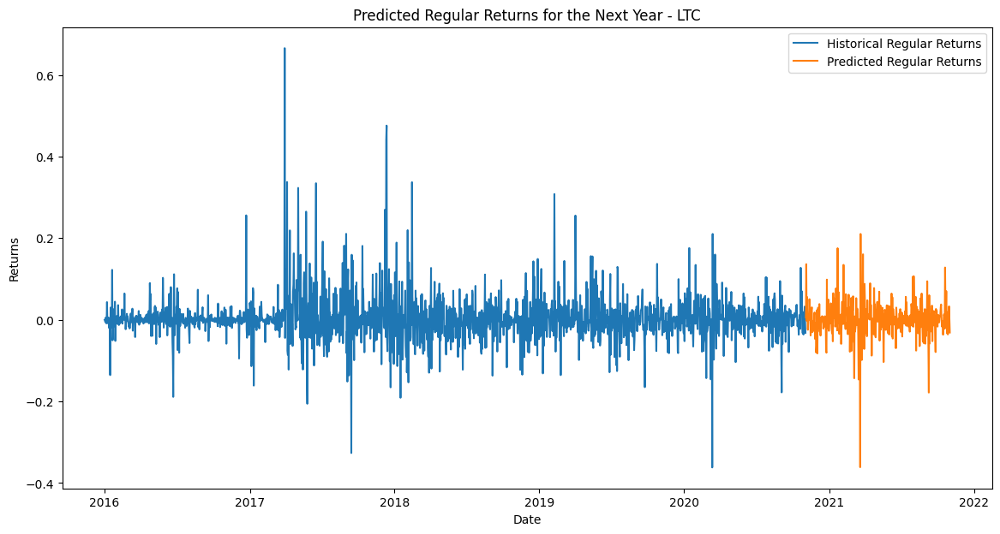

LTC - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing BCH


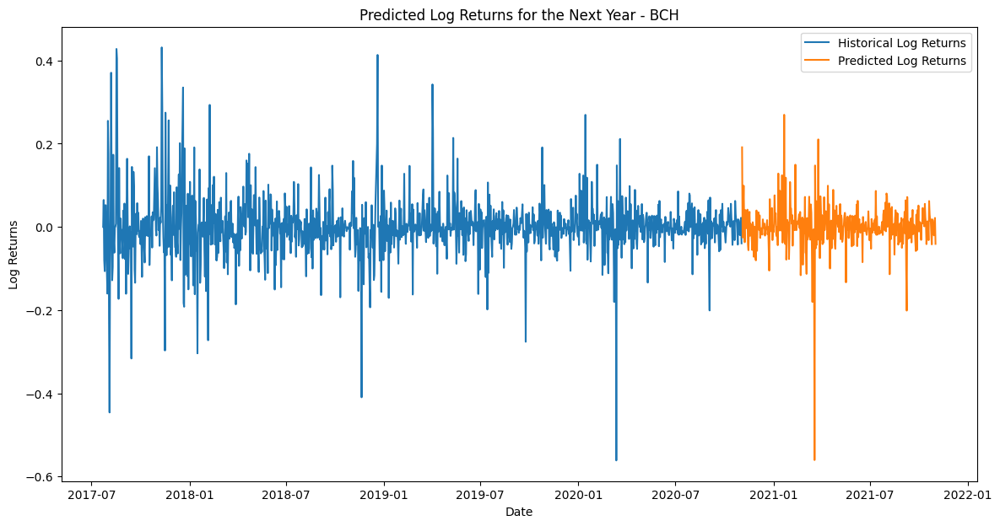

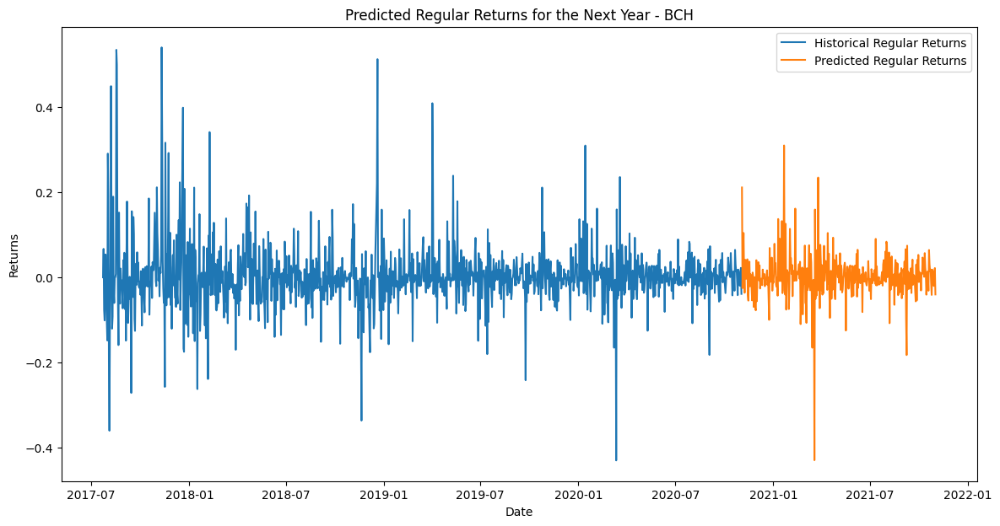

BCH - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing ADA


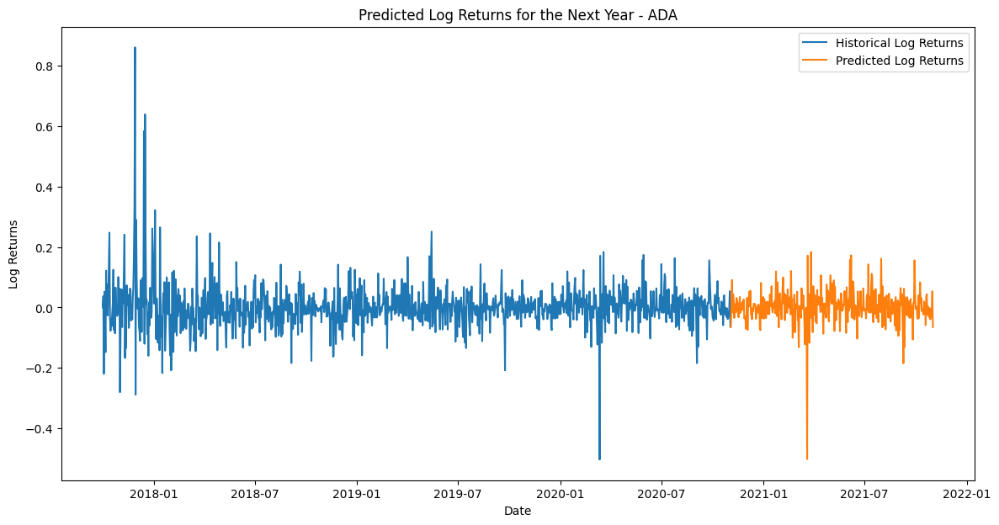

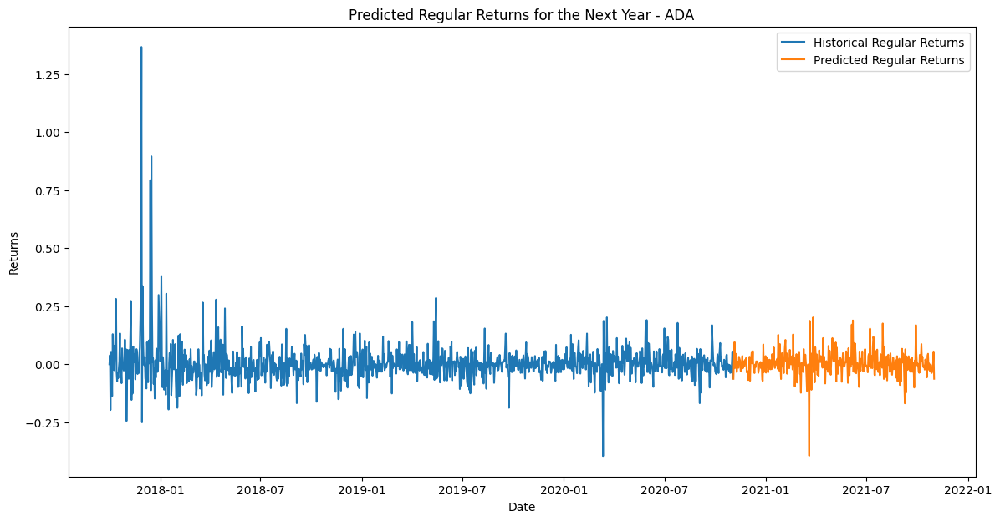

ADA - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing DASH


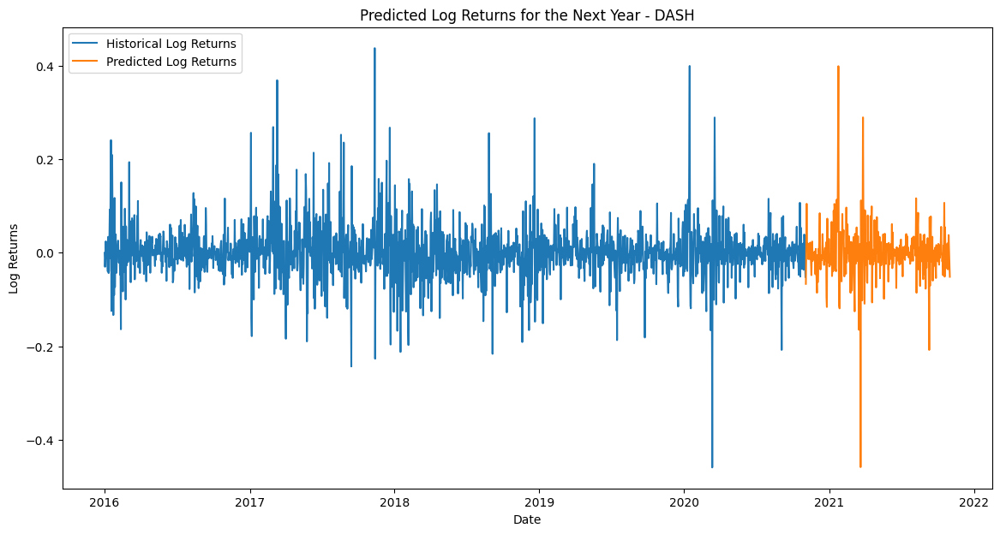

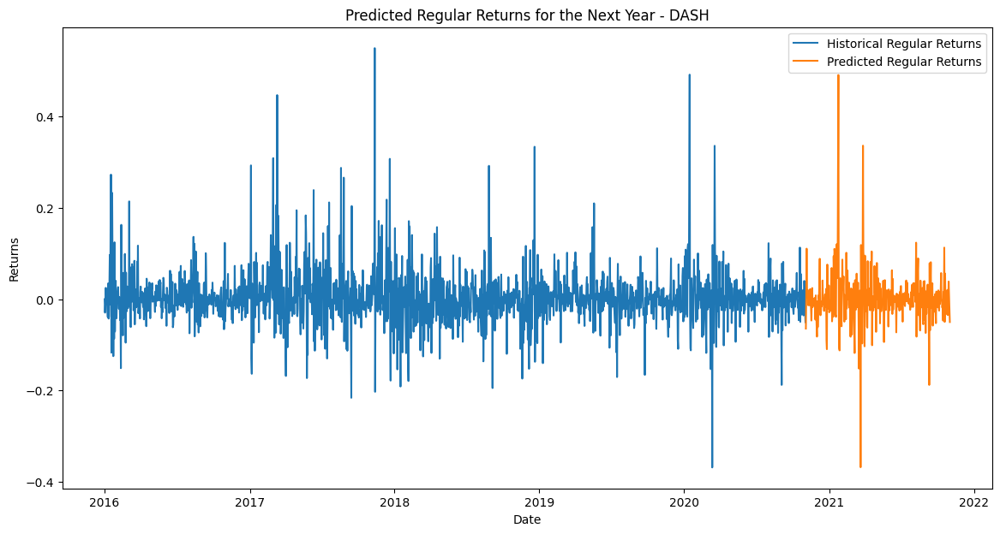

DASH - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing ETC


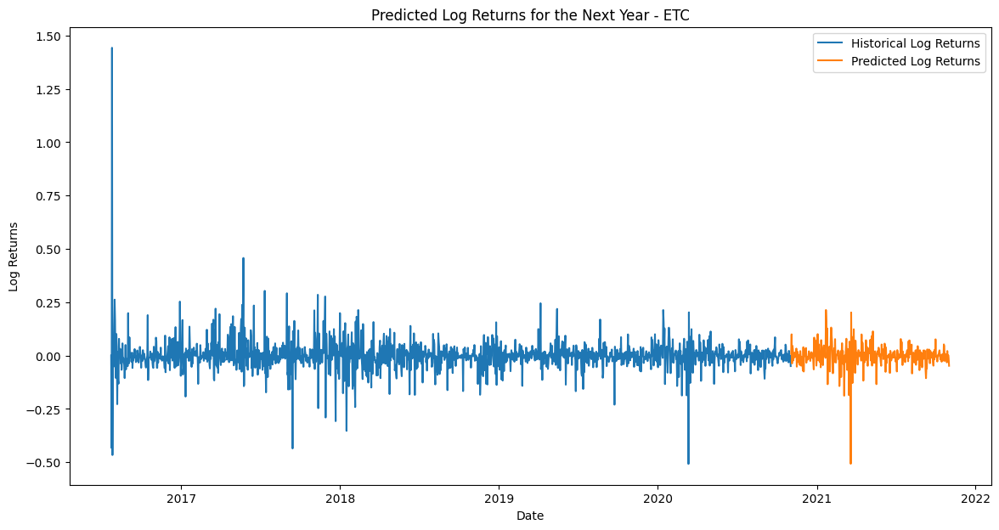

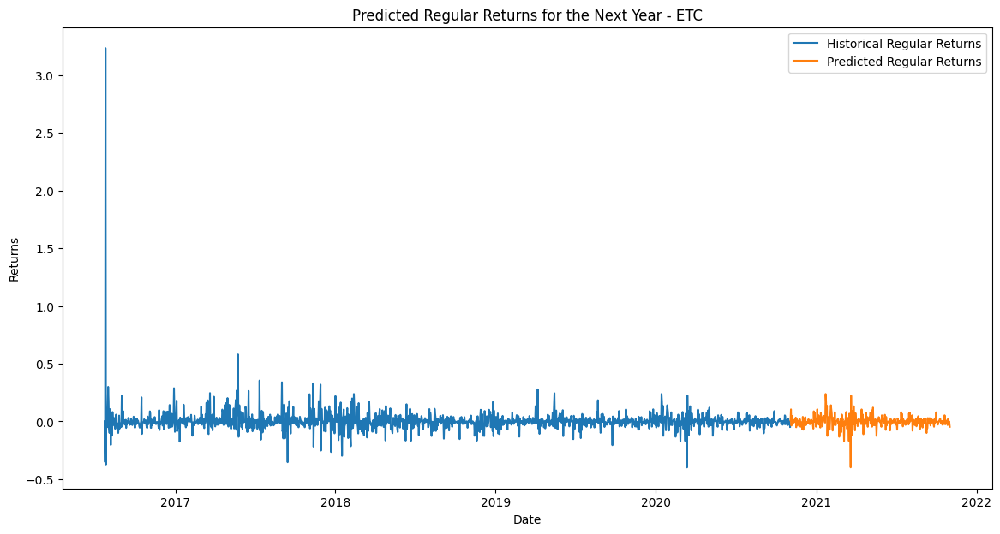

ETC - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing ZEC


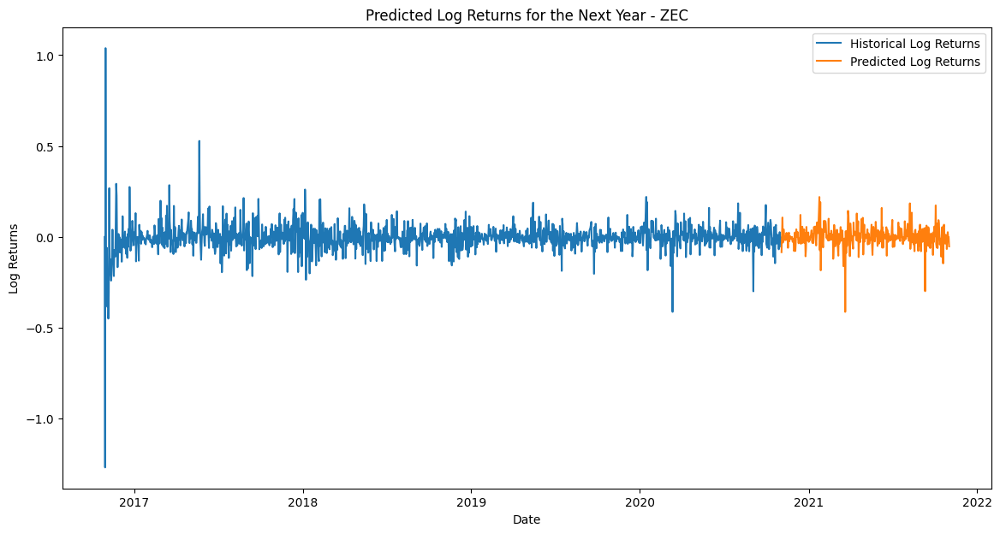

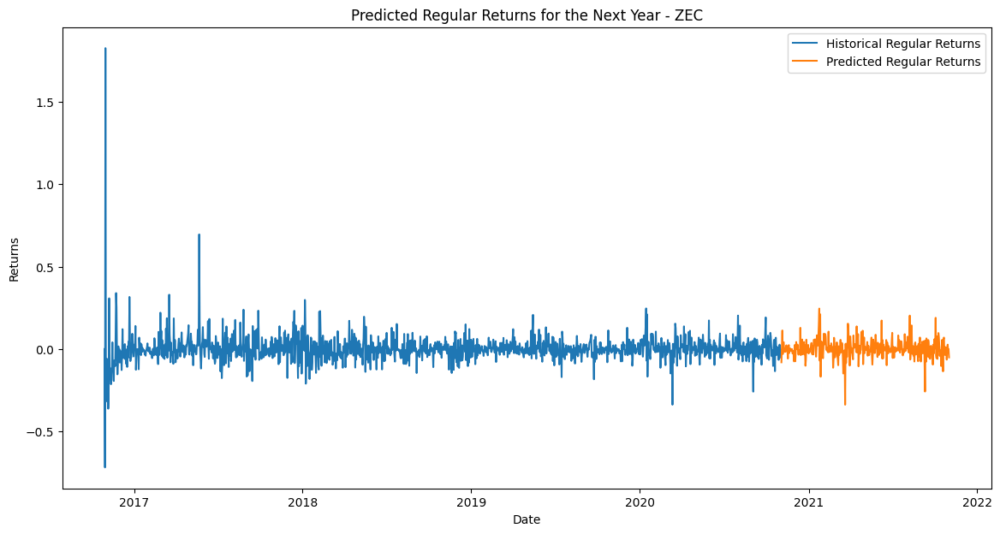

ZEC - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing BTG


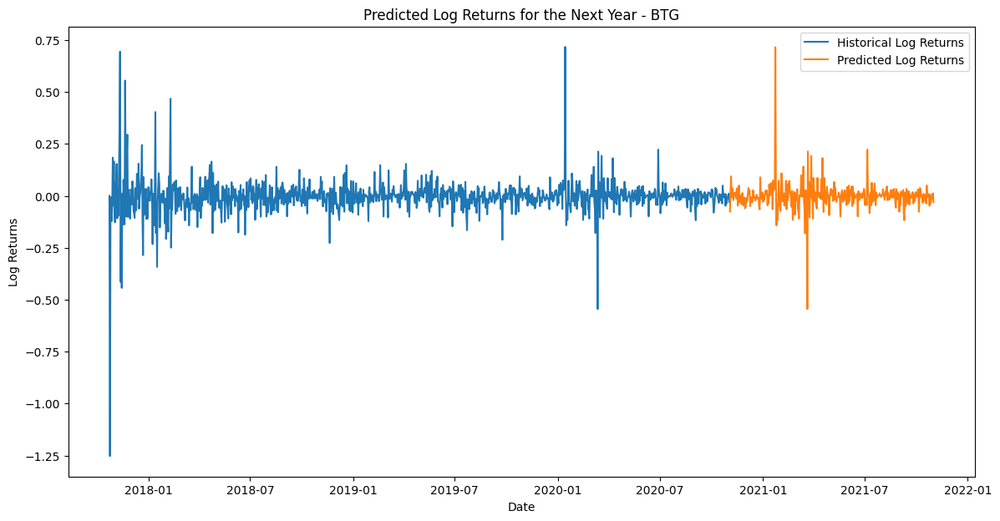

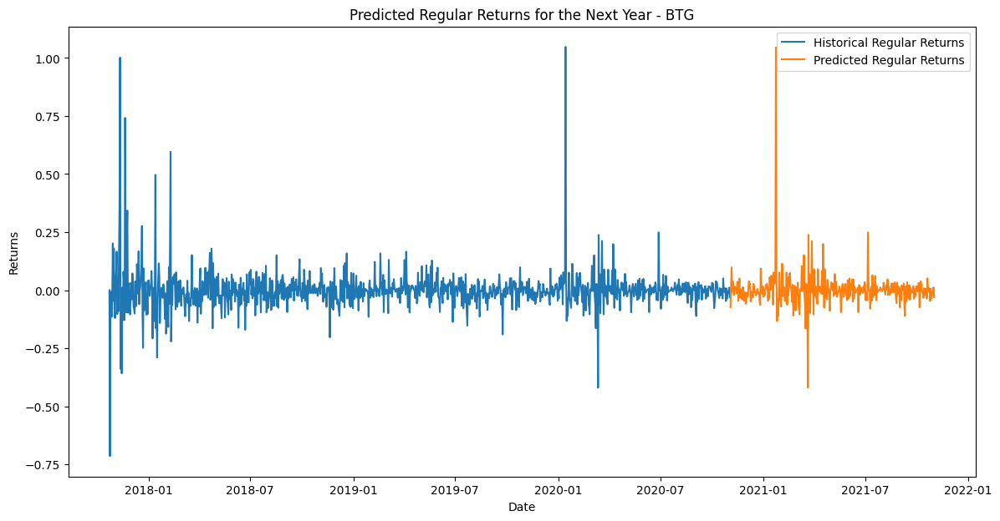

BTG - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing DCR


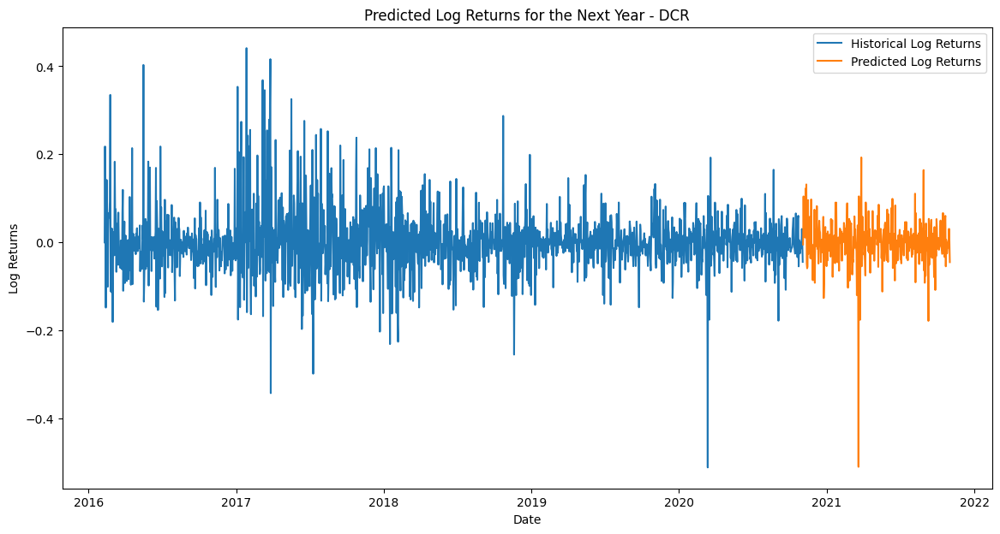

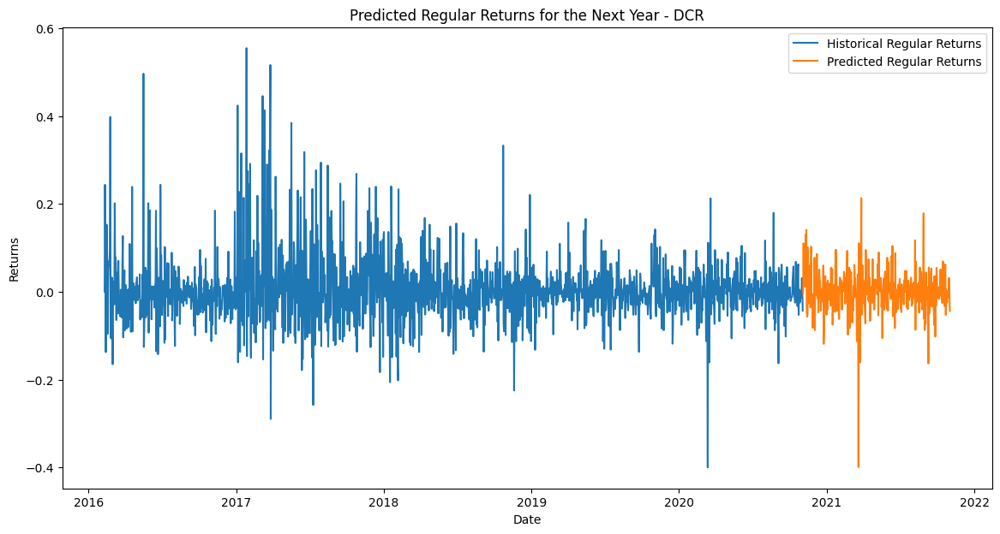

DCR - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing BCD


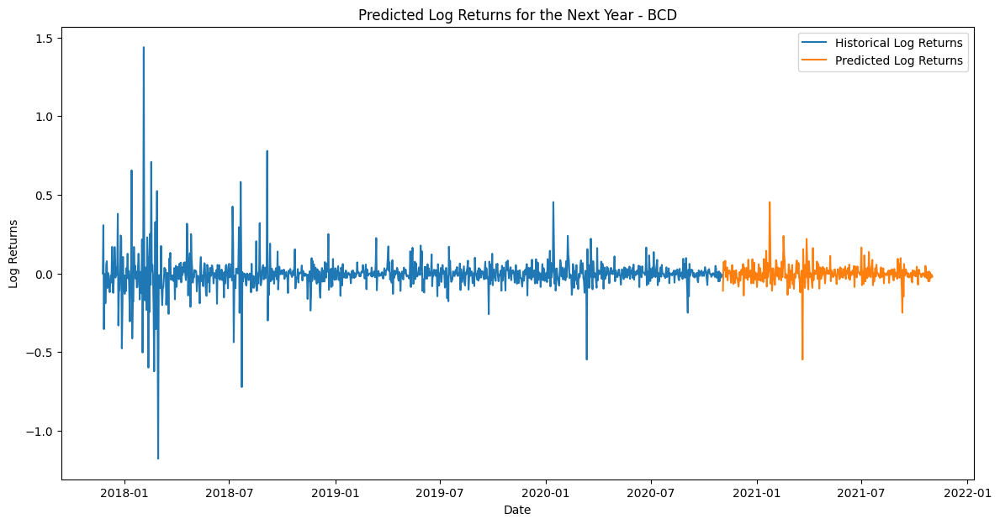

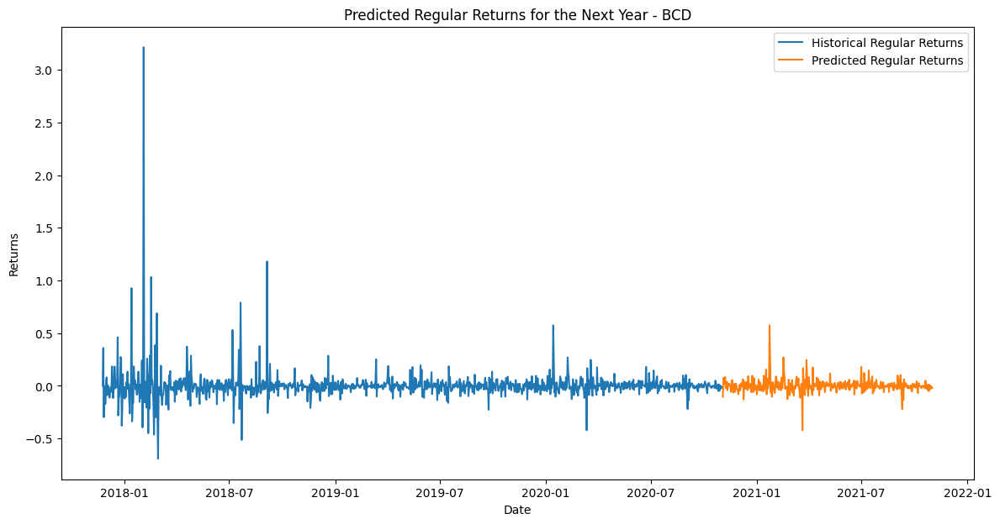

BCD - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing BCN


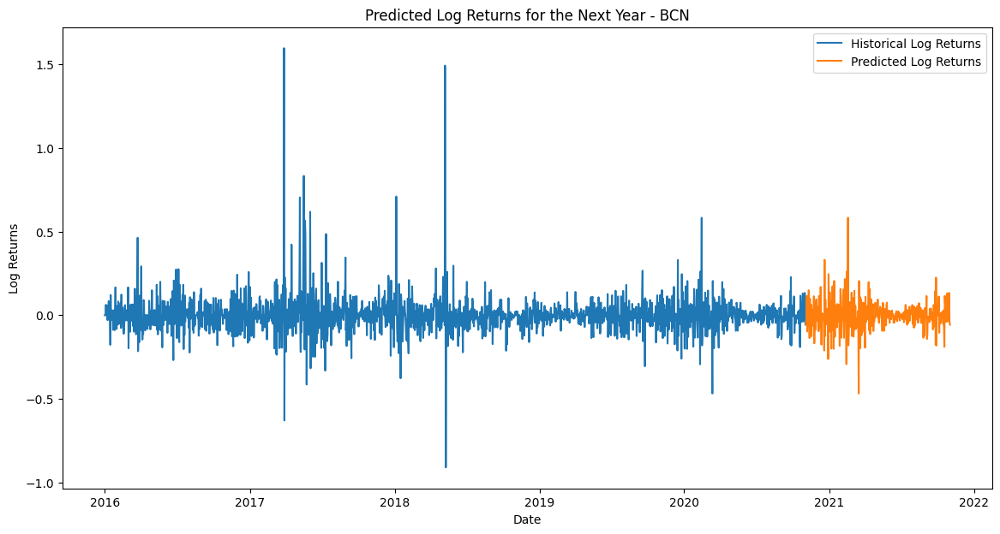

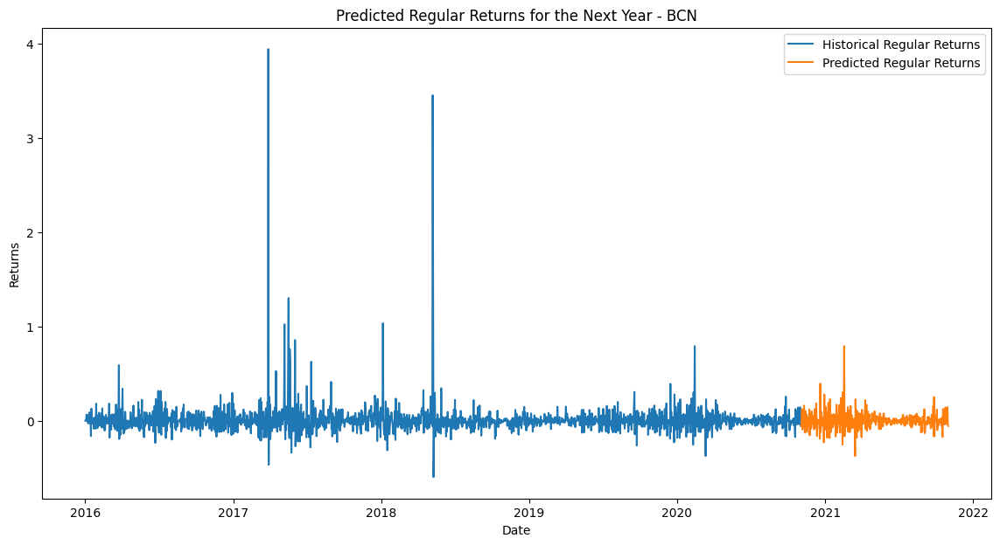

BCN - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing DGB


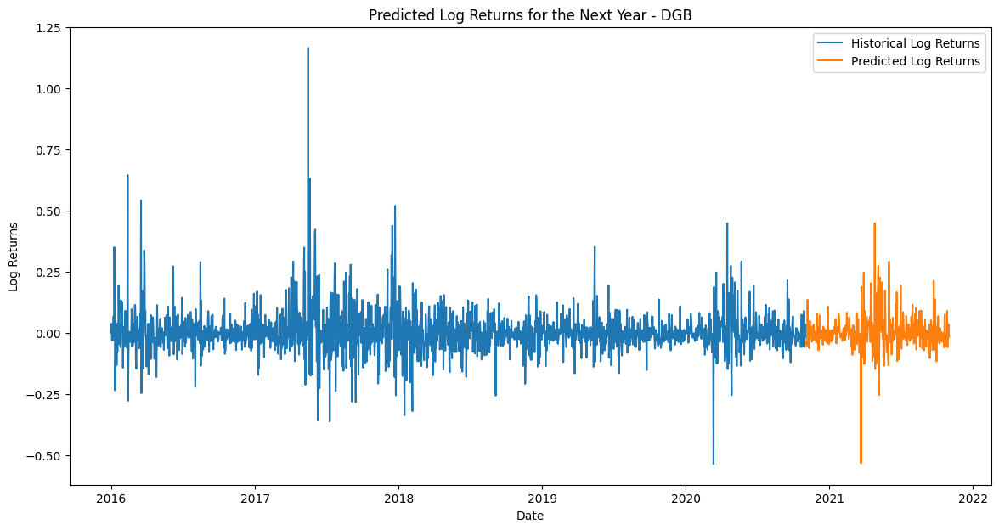

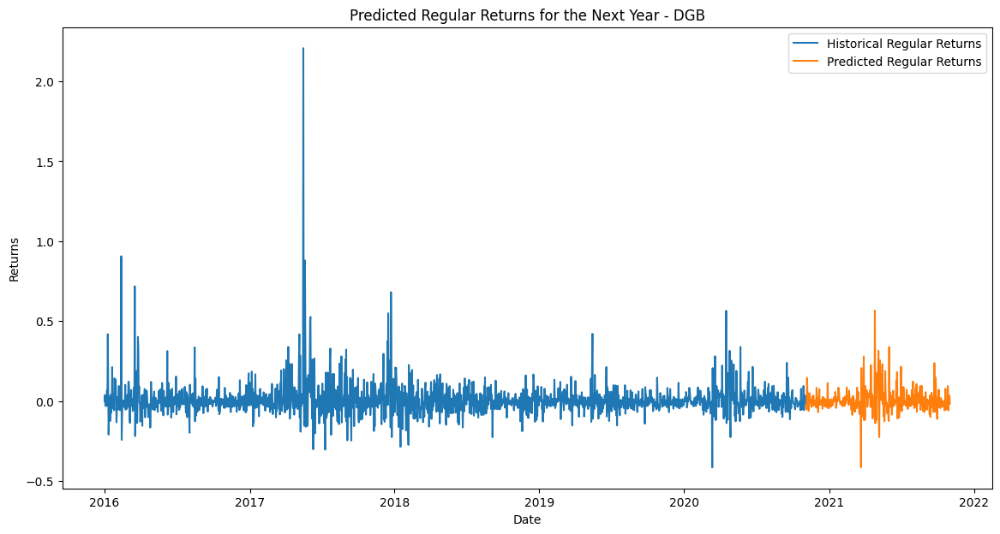

DGB - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing XVG


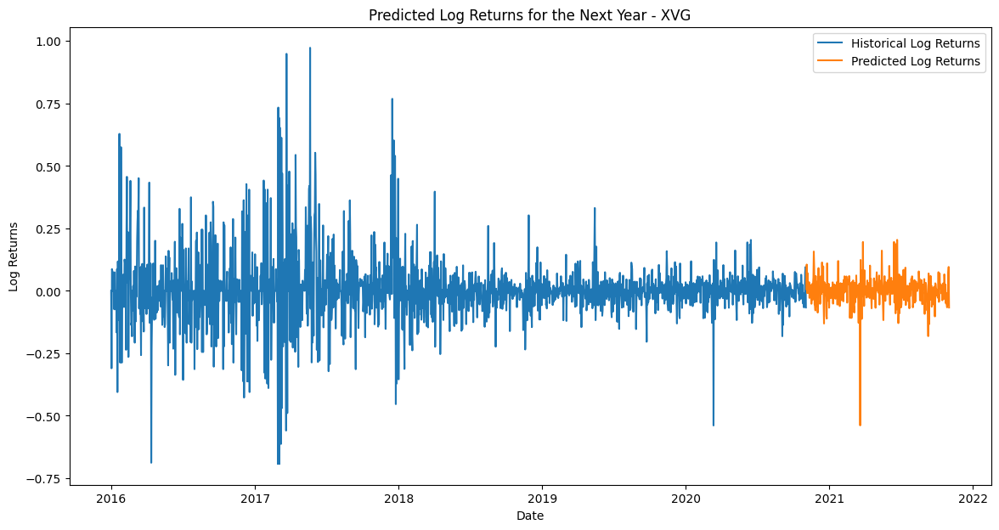

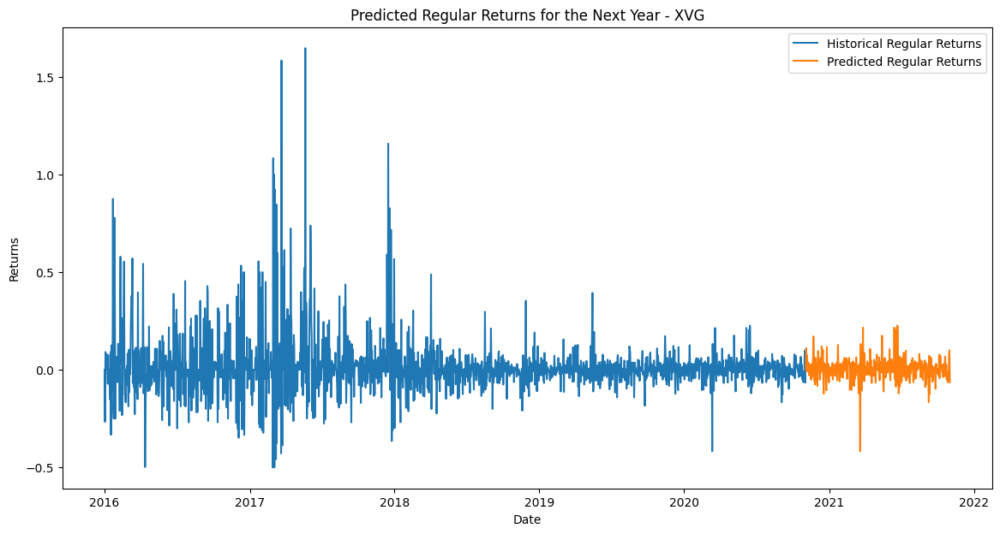

XVG - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing BTM


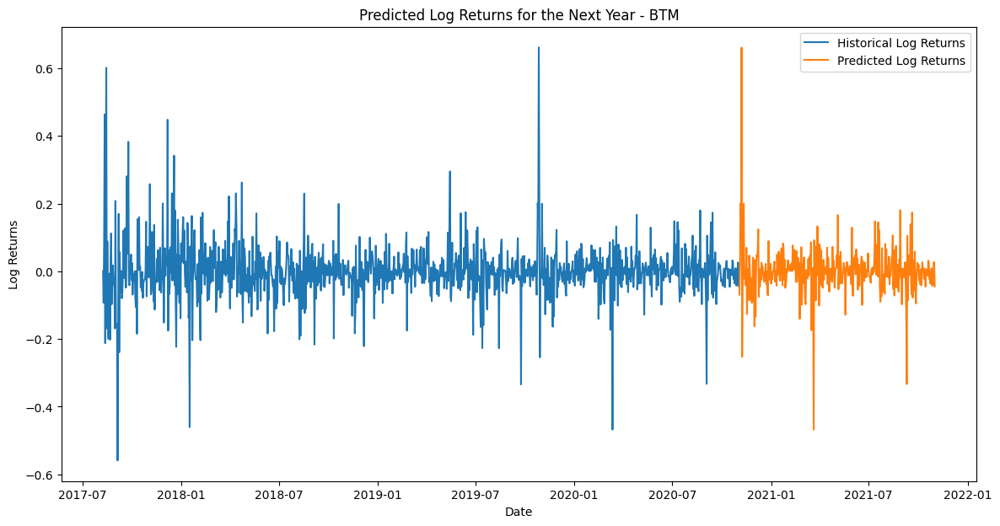

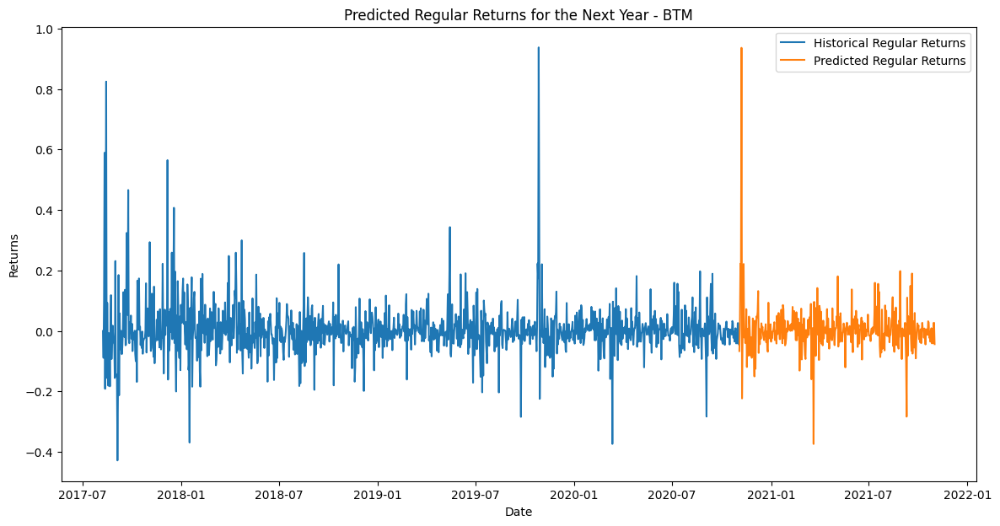

BTM - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing ETP


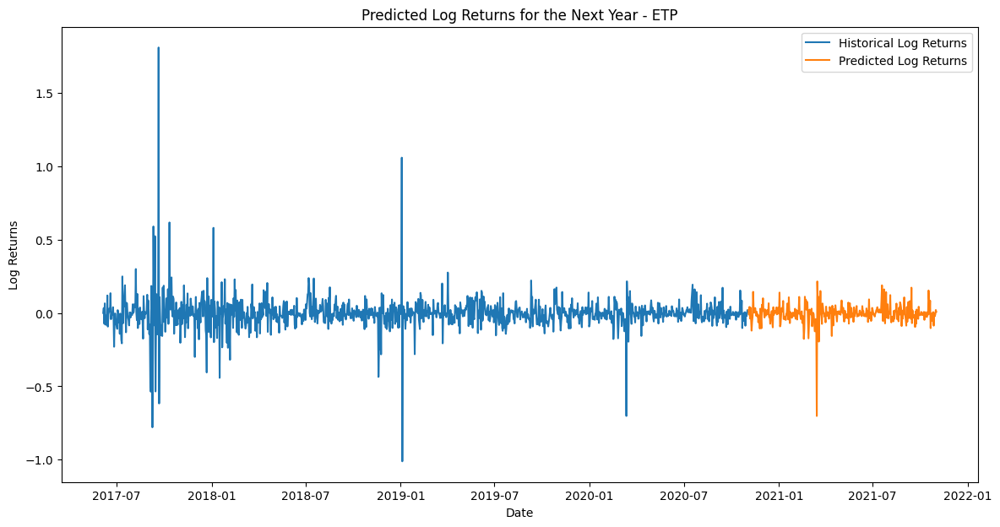

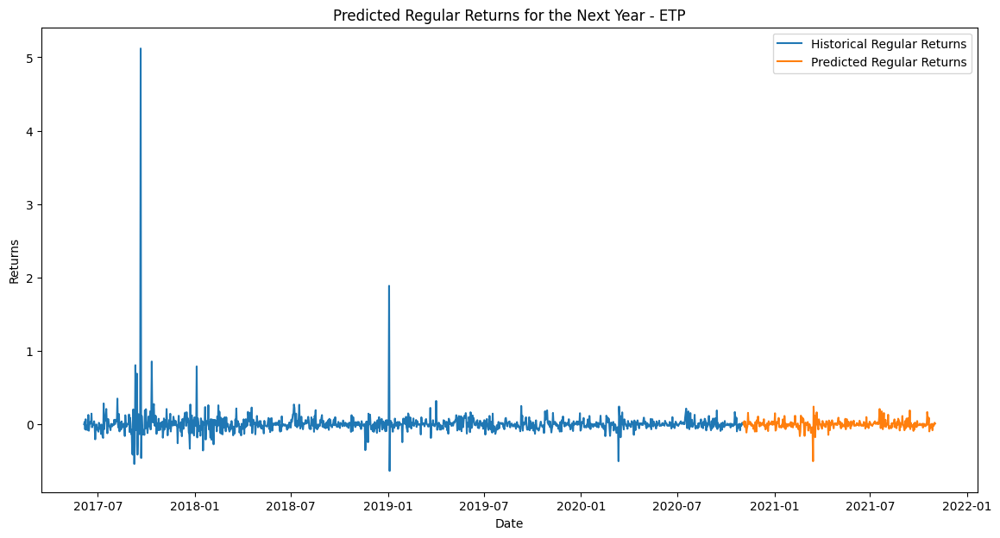

ETP - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing KMD


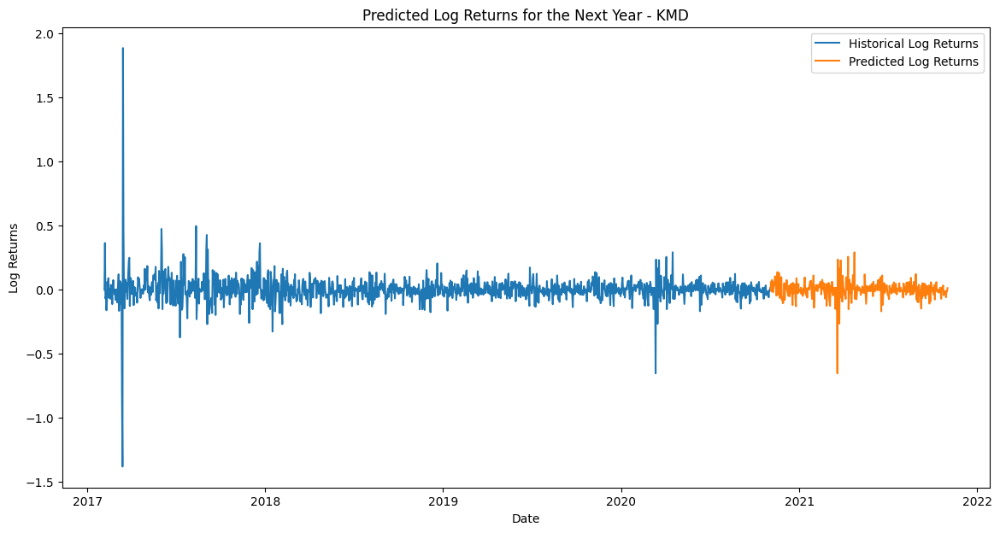

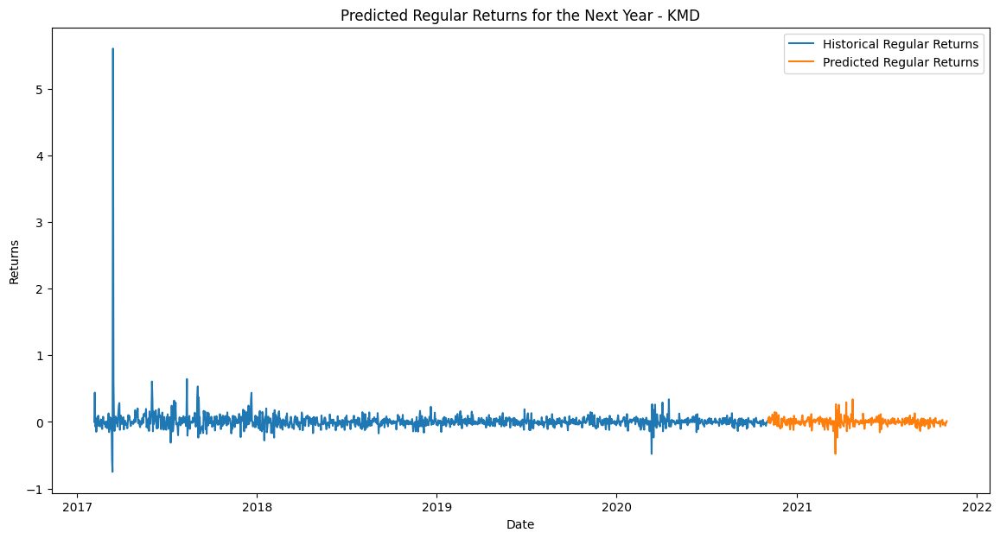

KMD - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing ETN


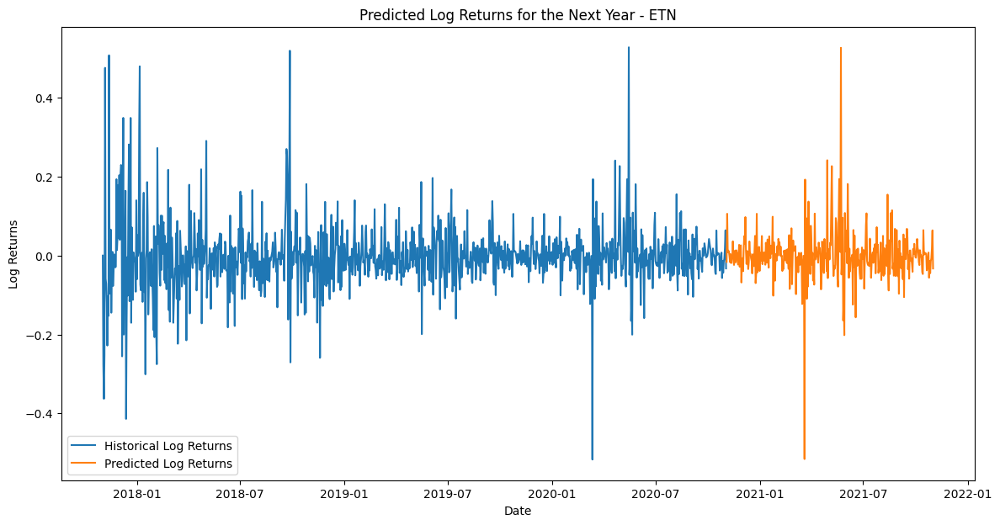

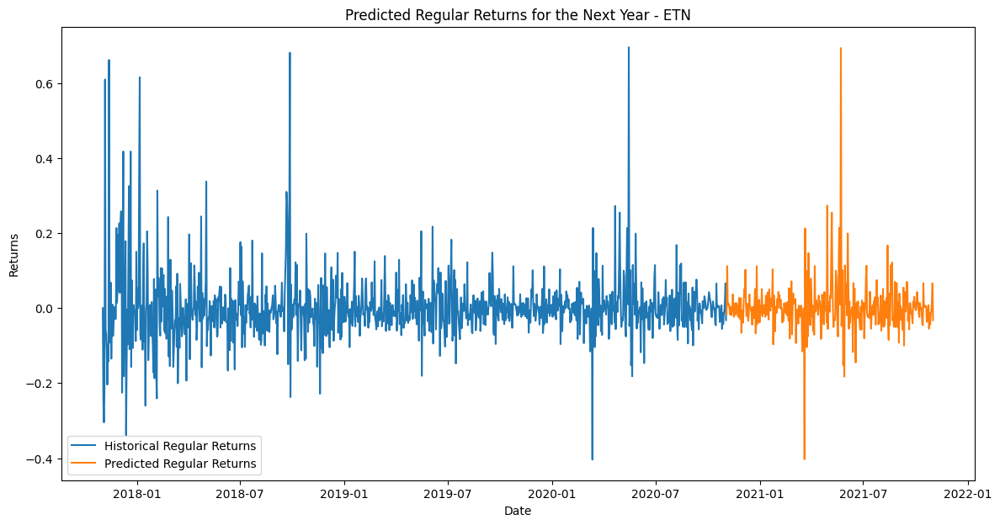

ETN - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing CNX


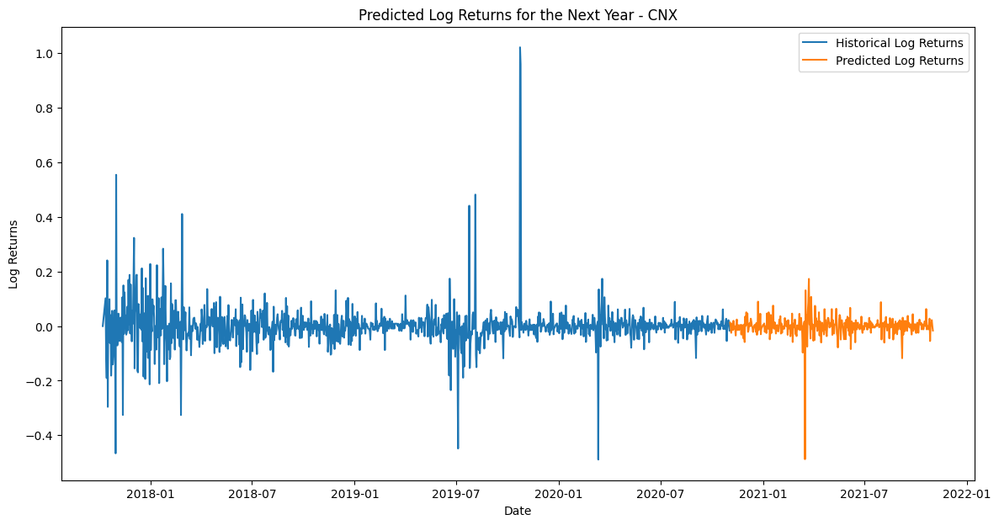

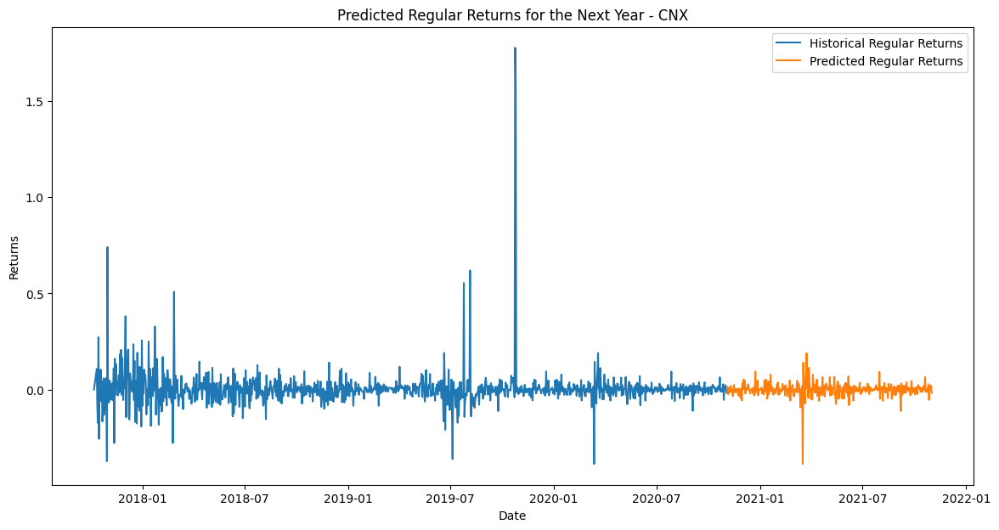

CNX - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing RVN


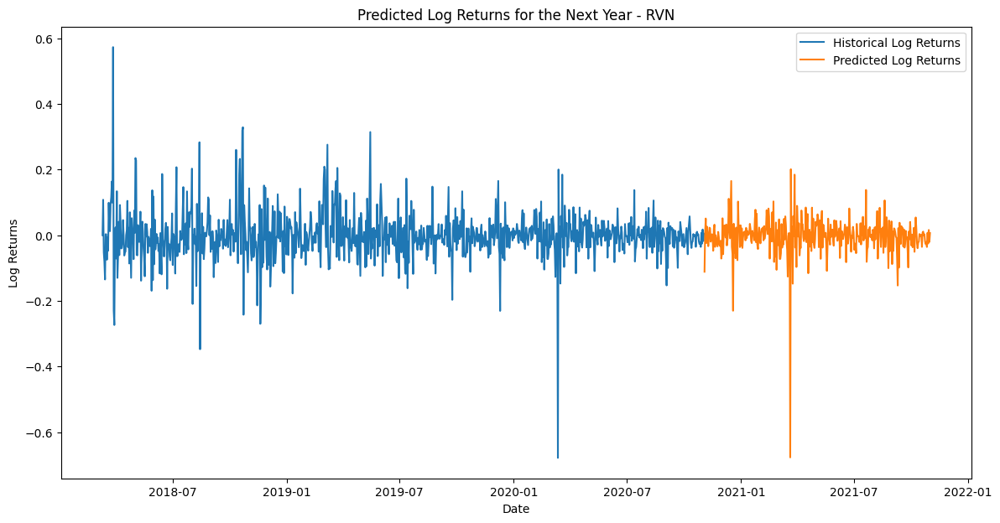

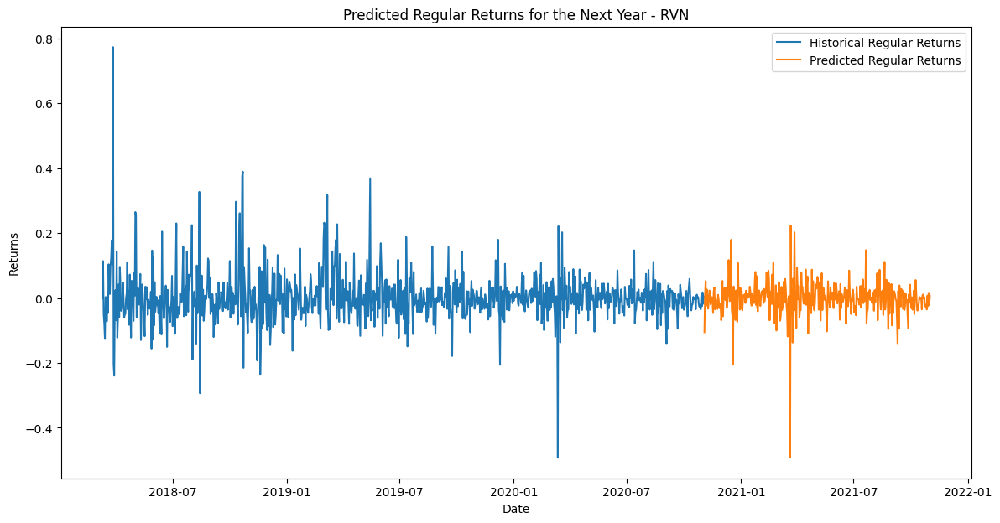

RVN - Future Log Returns and Regular Returns Predicted for the Next Year
Analyzing MONA


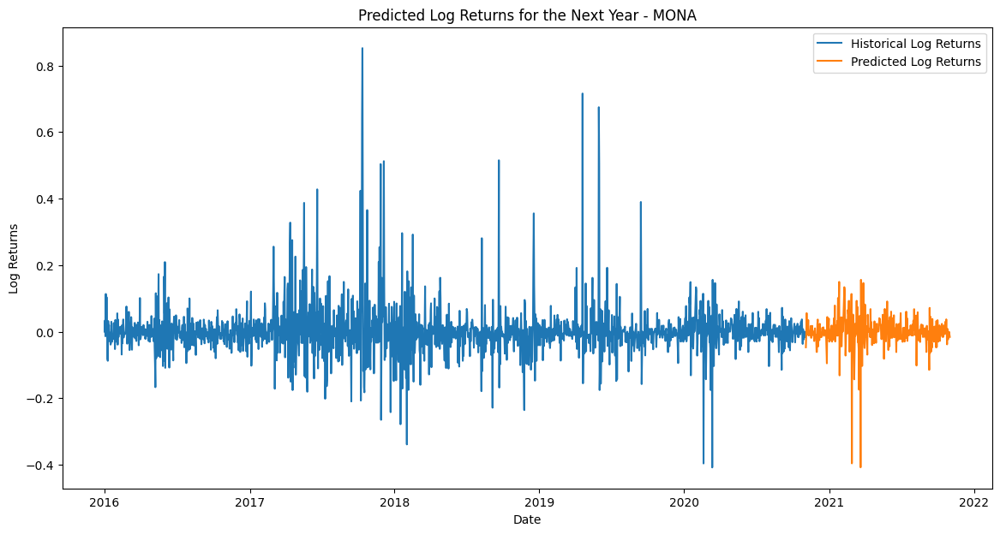

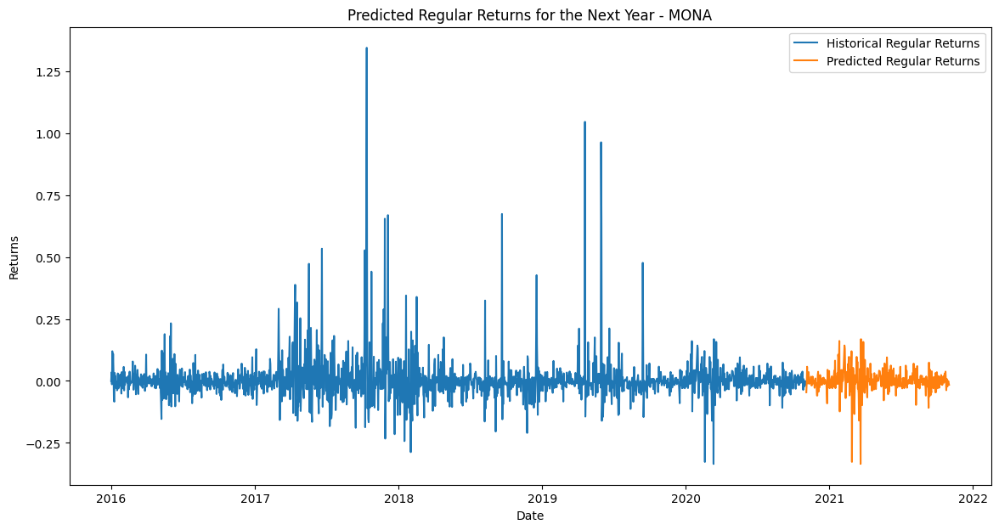

MONA - Future Log Returns and Regular Returns Predicted for the Next Year


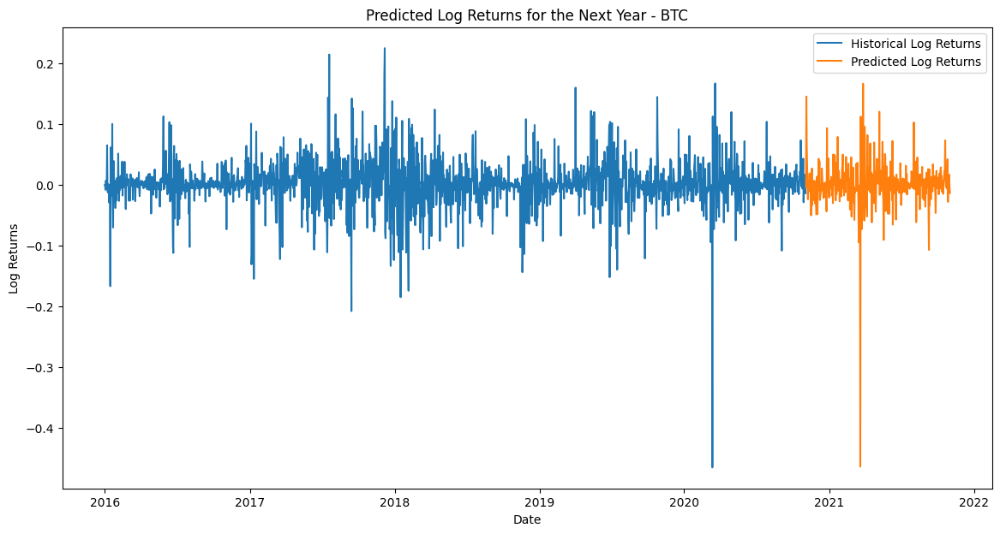

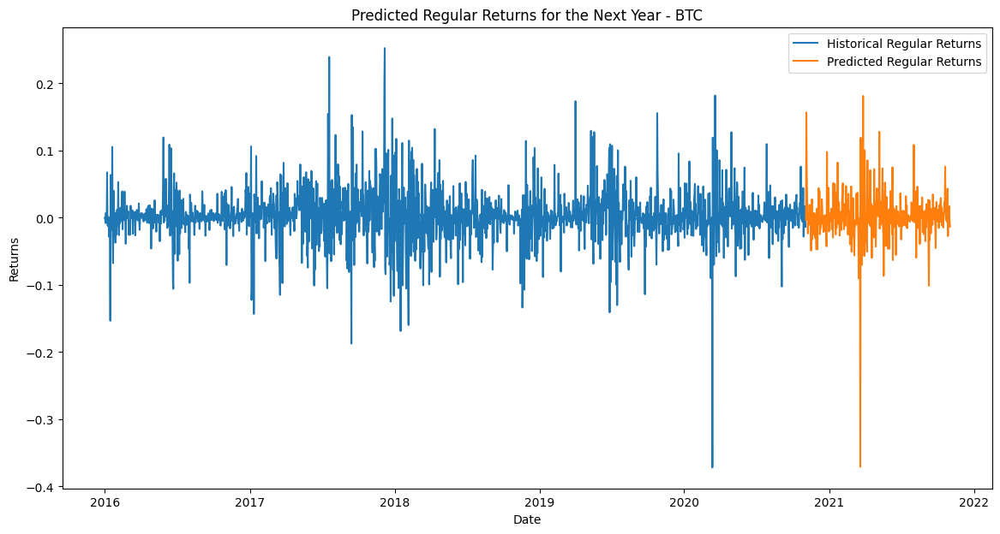

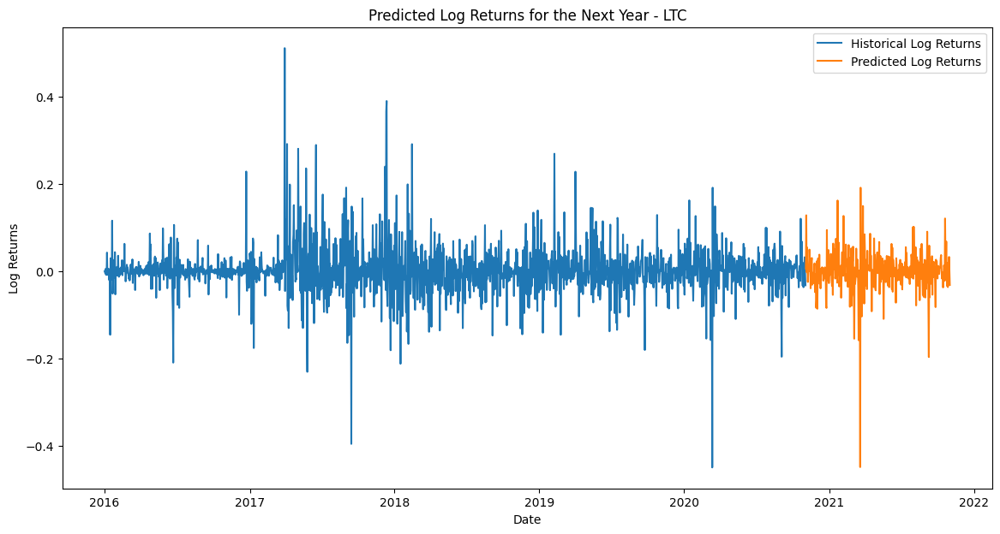

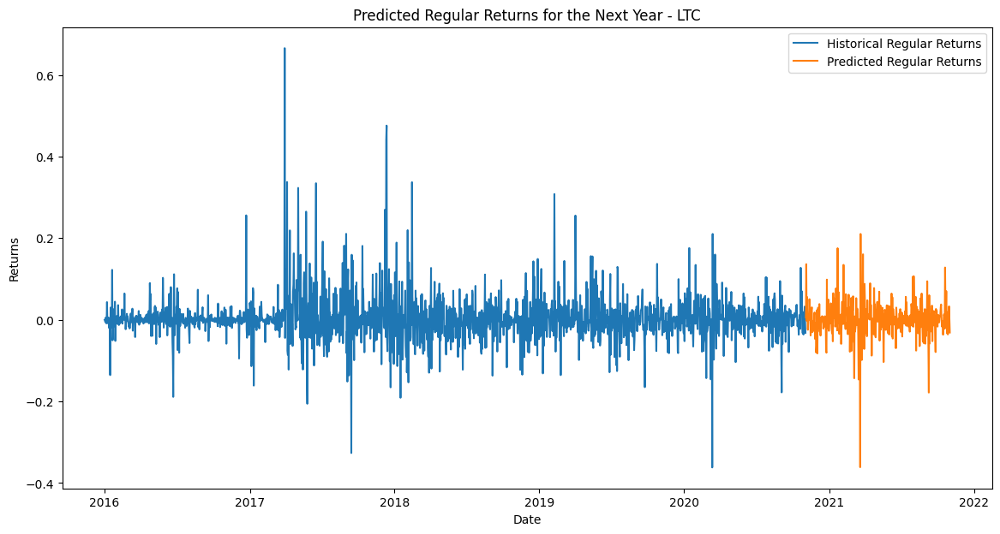

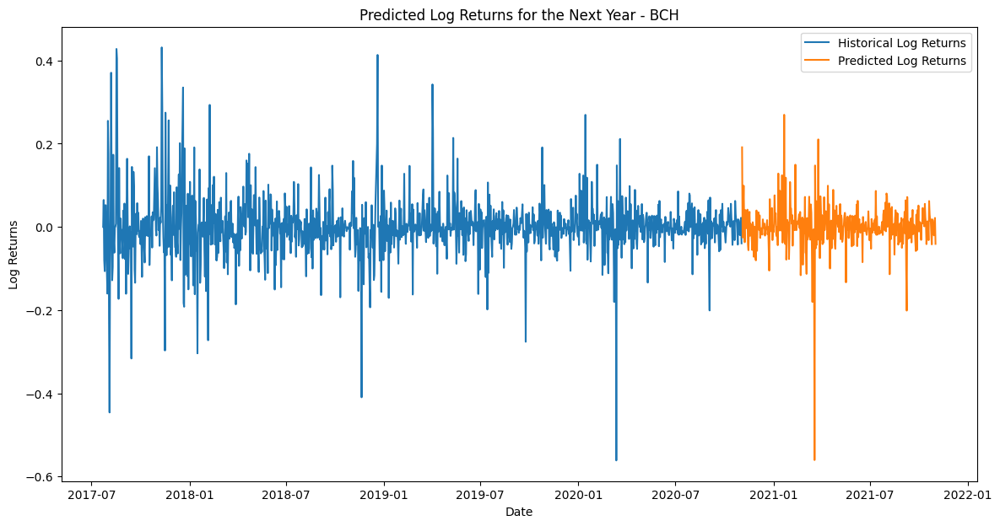

...

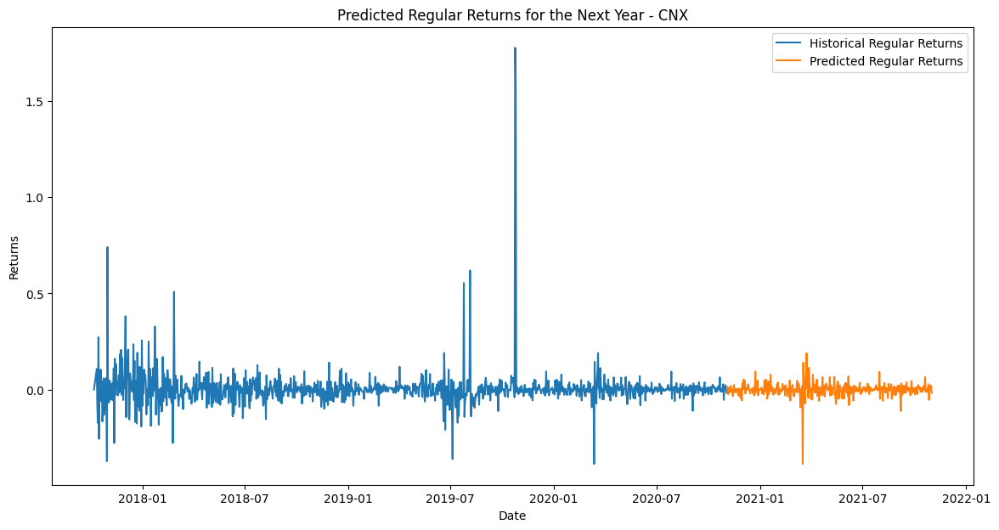

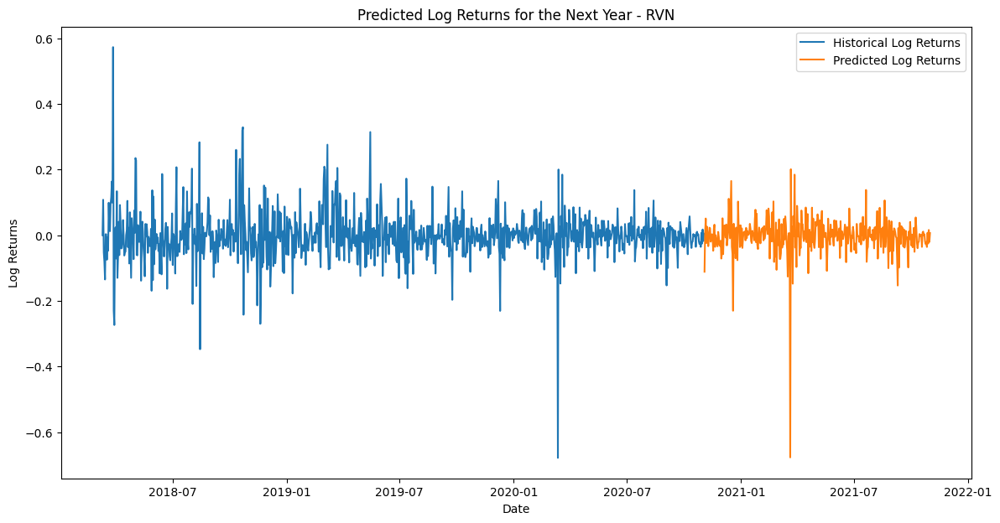

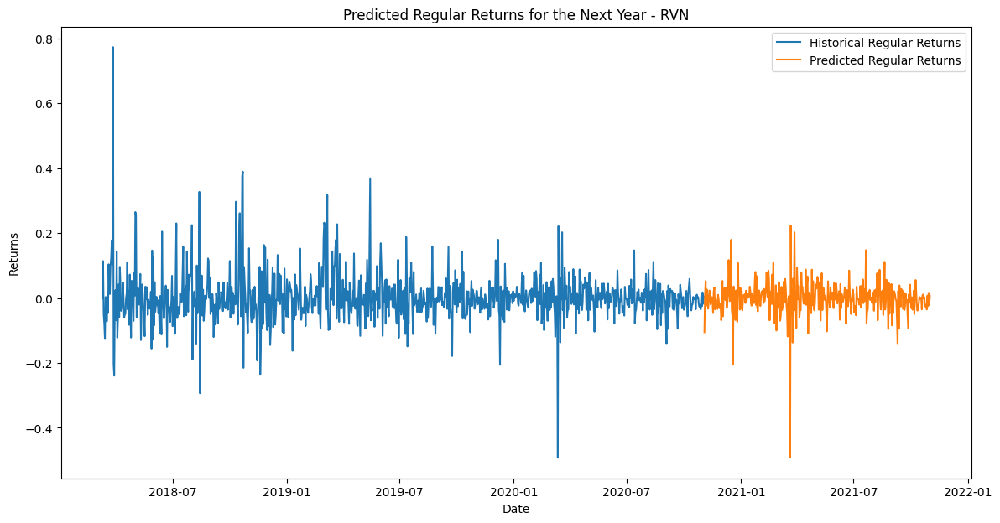

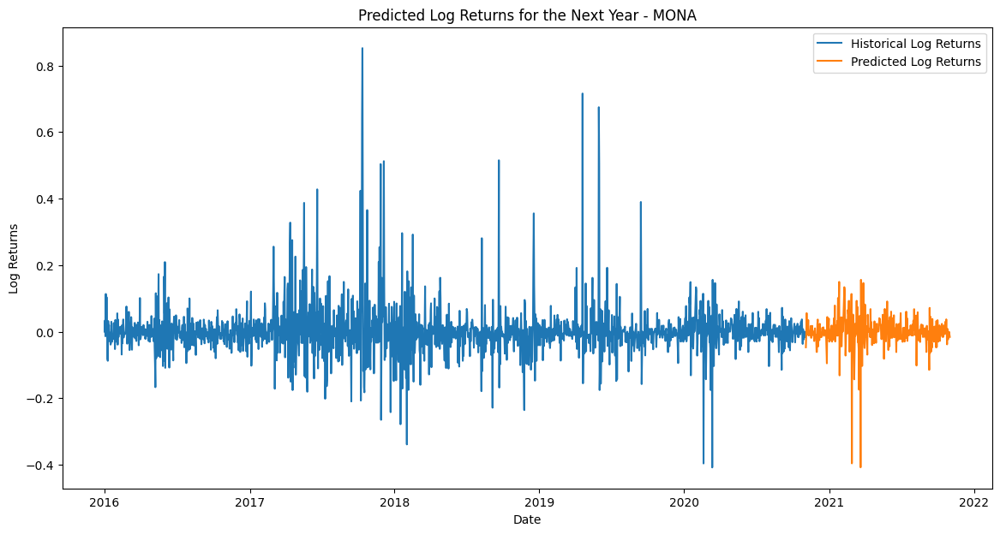

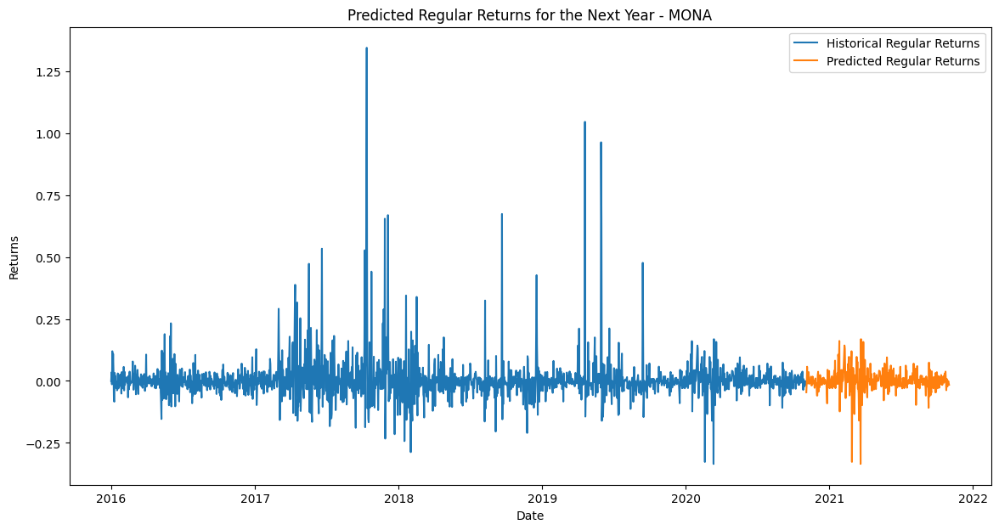

In [78]:
for ticker in top_20_tickers:
    print(f'Analyzing {ticker}')
    df_ticker = data[data['ticker'] == ticker].copy()
    df_ticker = feature_engineering(df_ticker)

    # Prepare the dataset
    X = df_ticker.drop(columns=['price_usd', 'price_btc', 'returns', 'log_returns', 'ticker', 'max_supply'])
    y = df_ticker['log_returns']

    # Ensure all columns in X are numeric
    X = X.apply(pd.to_numeric, errors='coerce')
    X = X.fillna(0)

    # Feature scaling
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # Train the XGBoost model on the entire dataset
    xgb_model = xgb.XGBRegressor(objective='reg:squarederror')
    xgb_model.fit(X_scaled, y)

    # Predict future log returns
    future_predictions_log, future_predictions_regular, future_dates = predict_next_year_log_returns(df_ticker, ticker)

    # Print final predictions
    print(f'{ticker} - Future Log Returns and Regular Returns Predicted for the Next Year')

# Predict next year's log returns using XGBoost on the entire dataset for all tickers
for ticker in top_20_tickers:
    df_ticker = data[data['ticker'] == ticker].copy()
    predict_next_year_log_returns(df_ticker, ticker)
